# Patch-clamp experiment data analysis

*This notebook contains the data analysis for the patch-clamp experiment in the paper **ADD REFERENCE** .*

# 1. Load data

Paste the path of the dataset folder in the following cell:

In [1]:
data_dir = 'C:/Data/Antonio/data/Philip/081114Patch clamp/nanorods 630/fov2 - good/122018_take1 100Hz'
dataset_label = 'Take1'

The following cell imports libraries and sets plot and notebook style:

In [2]:
from __future__ import division
import numpy as np
import scipy.ndimage as ndi

%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('darkgrid')
sns.set_context('notebook', font_scale=1.2)
def patch_violin_plot():
    """Patch seaborn's violinplot in current axis to workaround matplotlib's bug #5423.
    https://github.com/matplotlib/matplotlib/issues/5423
    """
    from matplotlib.collections import PolyCollection
    ax = plt.gca()
    for art in ax.get_children():
        if isinstance(art, PolyCollection):
            art.set_edgecolor((0.3, 0.3, 0.3))

from figscroller import FrameScroller, HorizontalScroller
from patchclamp import PatchDataset
import timetraces as tt

from IPython.display import display, FileLink
from IPython.core.display import HTML
HTML(open("./styles/custom2.css", "r").read())

C:\Users\laser2002j\Miniconda3\envs\voltagesensing_env_py3\lib\site-packages\matplotlib\__init__.py:872: UserWarning: axes.color_cycle is deprecated and replaced with axes.prop_cycle; please use the latter.
  warnings.warn(self.msg_depr % (key, alt_key))


The actual data loading happens here:

In [3]:
data = PatchDataset(data_dir)

The variable `data` contains the full dataset, both the video (`data.video`) and the voltage and current measurements. Moreover, it contains all the measurement "parameters", displayed below:

In [4]:
data.params

{'488nm laser effciency': 0.502305,
 'Horizontal pixel': 272.0,
 'Laser DAQ rate (Hz)': 10000.0,
 'Laser mod # cycles per color': 5.0,
 'Laser modulation freq. (Hz)': 4.0,
 'Laser pump recorded': 0.0,
 'Square frame rate (Hz)': 400.0,
 'Square wave # cycles per color': 500.0,
 'Square wave DAQ rate (Hz)': 10000.0,
 'Square wave frequency (Hz)': 100.0,
 'Square wave recorded': 1.0,
 'Triangle frame rate (Hz)': 10.0,
 'Triangle wave # cycles per color': 3.0,
 'Triangle wave DAQ rate (Hz)': 1000.0,
 'Triangle wave frequency (Hz)': 0.1,
 'Triangle wave recorded': 0.0,
 'Vertical pixel': 192.0}

Among these parameters, the video frame rate is: 

In [5]:
data.params['Square frame rate (Hz)']

400.0

The attributes `data.voltage_full`, `current_full` (and `time_full`) contain the full DAQ acquisitions @ 10kHz.

The attributes `data.voltage`,  (and `current`, `time`) are resampled versions at the camera frame rate.

The following plot shows the voltage waveform (*blue line*) and the start of each camera frame (*black squares*):

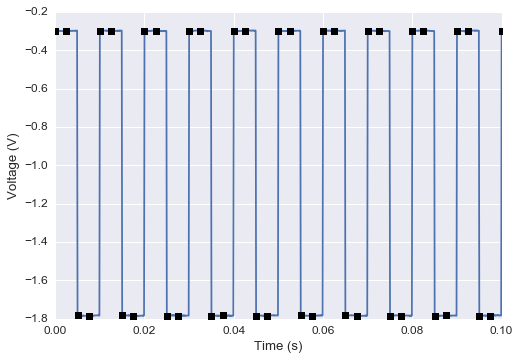

In [6]:
fig, ax = plt.subplots()
ax.plot(data.time_full, data.voltage_full, label='Voltage')
ax.plot(data.time, data.voltage, 'sk', label='Voltage')
ax.set_ylabel('Voltage (V)')
ax.set_xlabel('Time (s)')
ax.set_xlim(0, 0.1);

The following plot shows the full voltage and current timetraces:

C:\Users\laser2002j\Miniconda3\envs\voltagesensing_env_py3\lib\site-packages\matplotlib\__init__.py:892: UserWarning: axes.color_cycle is deprecated and replaced with axes.prop_cycle; please use the latter.
  warnings.warn(self.msg_depr % (key, alt_key))


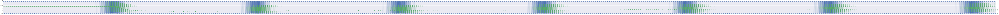

In [7]:
fig, ax = plt.subplots(figsize=(300, 4))

nstart, nstop = 0, -1
ax.plot(data.time_full[nstart:nstop], data.voltage_full[nstart:nstop], label='Voltage')
ax.set_ylabel('Voltage (V)')
ax2 = ax.twinx()
ax2.plot(data.time_full[nstart:nstop], data.current_full[nstart:nstop], label='Current',
         color=sns.color_palette()[1])
ax2.set_ylabel('Current (pA)')
ax2.grid(False)
ax2.set_xlabel('Time (s)');

A plot of the mean video frame is displayed below:

In [8]:
sns.set_style('dark')

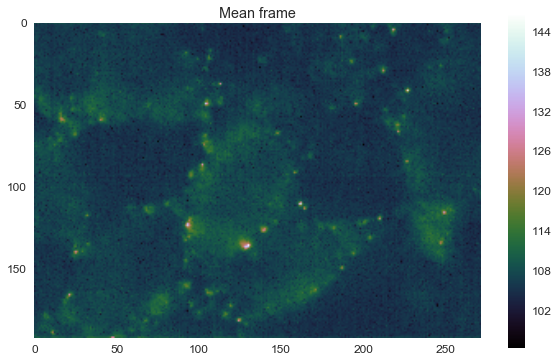

In [9]:
fig, ax = plt.subplots(figsize=(10, 6))
im = ax.imshow(data.video.mean(0), cmap='cubehelix')
plt.colorbar(im);
ax.set_title('Mean frame');

The video is loaded into an array with following dimensions:

In [10]:
data.video.shape

(1996, 192, 272)

# 2. Video Filtering

## Mean frame

In [11]:
mvideo = data.video.mean(0)
mvideo.shape, mvideo.dtype

((192, 272), dtype('float64'))

In [12]:
mvideo_highpass = mvideo - ndi.gaussian_filter(mvideo, sigma=8)
th = mvideo_highpass > 0.4*mvideo_highpass.max()

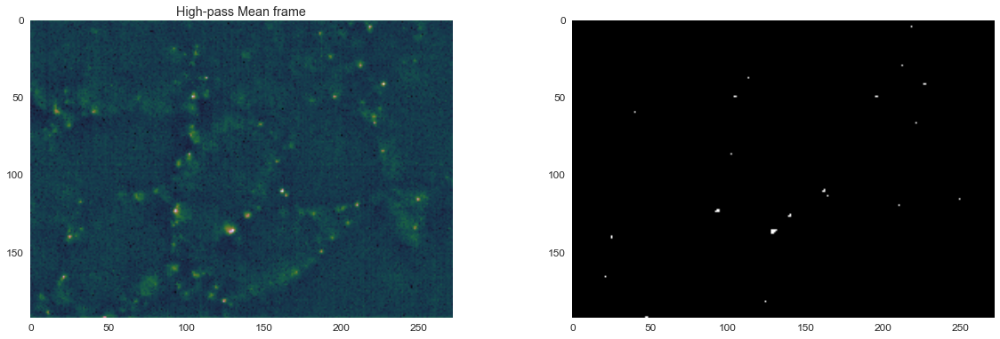

In [13]:
fig, ax = plt.subplots(1, 2, figsize=(20, 6))
im = ax[0].imshow(mvideo_highpass, cmap='cubehelix')
#plt.colorbar(im);
im = ax[1].imshow(th, cmap='cubehelix')
ax[0].set_title('High-pass Mean frame');

## Full-video

In [14]:
video_highpass = data.video - ndi.gaussian_filter(data.video.astype('float'), sigma=(6, 6, 10))
# video_highpass.shape, video_highpass.dtype

# fig, ax = plt.subplots(figsize=(10, 6))
# im = ax.imshow(video_highpass.mean(0), cmap='cubehelix')
# plt.colorbar(im);
# ax.set_title('Mean frame after HPF')

In [15]:
video_highpass.shape

(1996, 192, 272)

In [16]:
data.video.mean(), video_highpass.mean()

(106.8918665110552, -8.8503208433730624e-14)

In [17]:
video_highpass_tm = video_highpass - video_highpass.mean(axis=0)
video_highpass_tm.shape, video_highpass_tm.dtype

((1996, 192, 272), dtype('float64'))

In [18]:
video_highpass_on = np.zeros(data.video.shape[1:])
for row in range(data.video.shape[1]):
    for col in range(data.video.shape[2]):
        on_periods = video_highpass_tm[:, row, col] > 0
        video_highpass_on[row, col] = video_highpass_tm[on_periods, row, col].mean()
video_highpass_on.shape, video_highpass_on.dtype

((192, 272), dtype('float64'))

In [19]:
hp_frame = ndi.gaussian_filter(video_highpass_on, sigma=0.3)

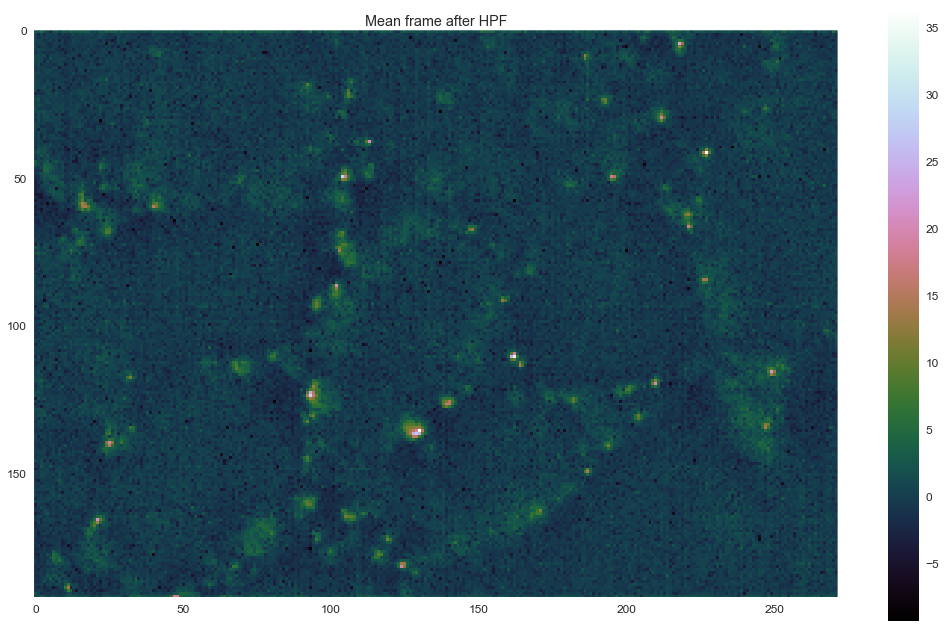

In [20]:
fig, ax = plt.subplots(figsize=(18, 11))
im = ax.imshow(video_highpass.mean(0), cmap='cubehelix', interpolation='none')
plt.colorbar(im);
ax.set_title('Mean frame after HPF');

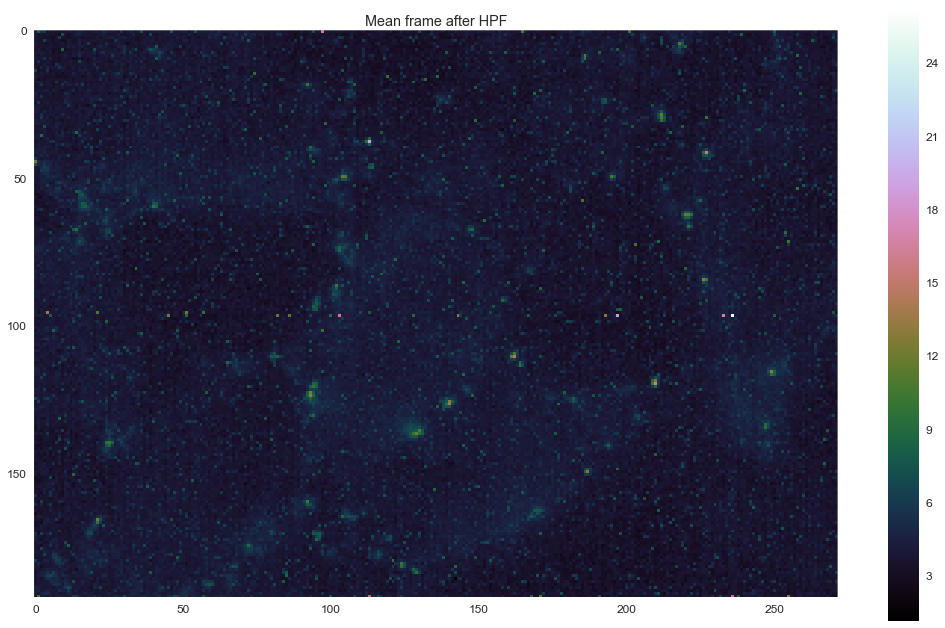

In [21]:
fig, ax = plt.subplots(figsize=(18, 11))
im = ax.imshow(video_highpass_on, cmap='cubehelix', interpolation='none')
plt.colorbar(im);
ax.set_title('Mean frame after HPF');

# 3. QD positions and ROIs

In [22]:
# %matplotlib qt
# sns.set_style('dark')

Explore the video frame by frame:

In [23]:
# fig, ax = plt.subplots(figsize=(14, 9))
# im = ax.imshow(data.video.mean(0), cmap='cubehelix', interpolation='none')
# plt.colorbar(im)

# #scroller = FrameScroller(fig, im, data.video)
# points = plt.ginput(1, timeout=0)
# points

In [24]:
# fig, ax = plt.subplots(figsize=(14, 9))
# im = ax.imshow(frame, cmap='cubehelix', interpolation='none')
# plt.colorbar(im)
# points = plt.ginput(3, timeout=0)
# points

Or use only the mean frame:

In [25]:
# frame = data.video.mean(0)

# fig, ax = plt.subplots(figsize=(14, 9))
# im = ax.imshow(frame, cmap='cubehelix')
# plt.colorbar(im)
# #points = plt.ginput(10, timeout=0)
# #points

## QD on patched cell

In [26]:
frame = data.video.mean(0)

In [27]:
%matplotlib inline
sns.set_style('dark')

C:\Users\laser2002j\Miniconda3\envs\voltagesensing_env_py3\lib\site-packages\ipykernel\__main__.py:23: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


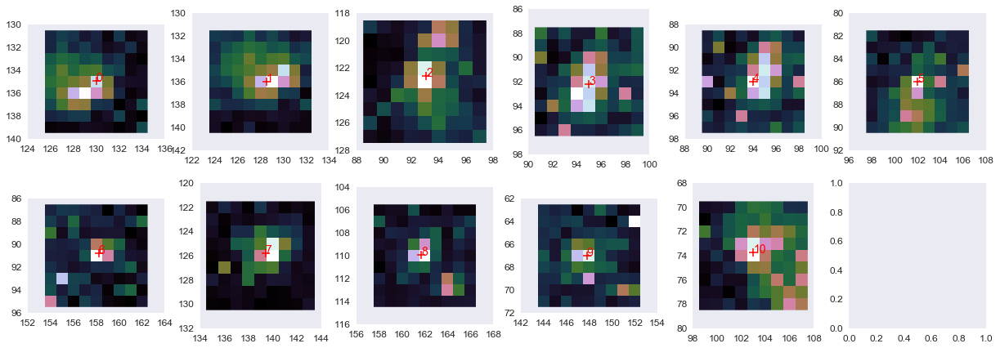

In [28]:
points_patched = \
    [(130, 134.9),
     (128.5, 136.),
     (93.1, 122.6),
     (95, 92.2),
     (94, 93),
     (102, 86.),
     (158.2, 90.8),
     (139.4, 125.8),
     (161.7, 109.9),
     (147.8, 67),
     (103., 73.7)]
    
nrows = 2
npoints = len(points_patched)
even_npoints = npoints if npoints % 2 == 0 else npoints + 1
ncols = even_npoints // 2

fig, ax = plt.subplots(nrows, ncols, figsize=(3.5*ncols, 3.5*nrows))
axr = ax.ravel()
for ip, point in enumerate(points_patched):
    rpoint = np.round(point)
    roi = tt.get_roi_square(rpoint, pad=4)
    axr[ip].imshow(hp_frame[roi], cmap='cubehelix', interpolation='none',
                   extent=(roi[1].start-0.5, roi[1].stop-0.5, roi[0].stop-0.5, roi[0].start-0.5))
    axr[ip].plot(point[0], point[1], 'r+', ms=10, mew=1.5)
    axr[ip].annotate('%d' % ip, point, color='red', fontsize=14)

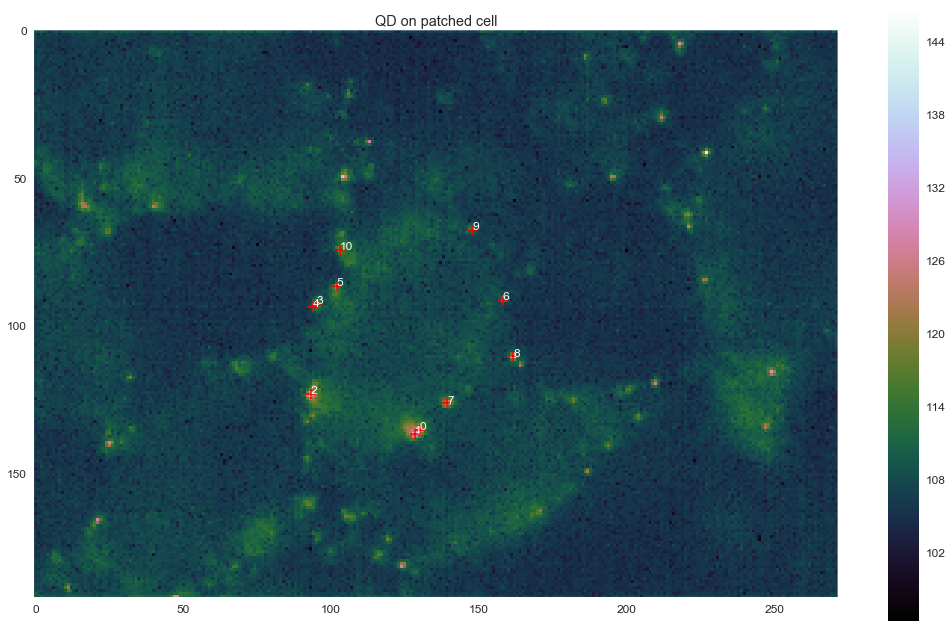

In [29]:
fig, ax = plt.subplots(figsize=(18, 11))
for ip, point in enumerate(points_patched):
    plt.plot(point[0], point[1], 'r+', ms=10, mew=1.5)
    plt.annotate('%d' % ip, point, color='white', fontsize=12)
im = ax.imshow(data.video.mean(0), cmap='cubehelix', interpolation='none')
plt.colorbar(im);
ax.set_title('QD on patched cell');

### QDs selection: unique positions

In [30]:
ipoints_patched_sel = (1, 2, 4, 5, 6, 7, 8, 9)
points_patched_sel = [points_patched[i] for i in ipoints_patched_sel]

## QD unpatched cells

In [31]:
%matplotlib inline
sns.set_style('dark')

C:\Users\laser2002j\Miniconda3\envs\voltagesensing_env_py3\lib\site-packages\ipykernel\__main__.py:27: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


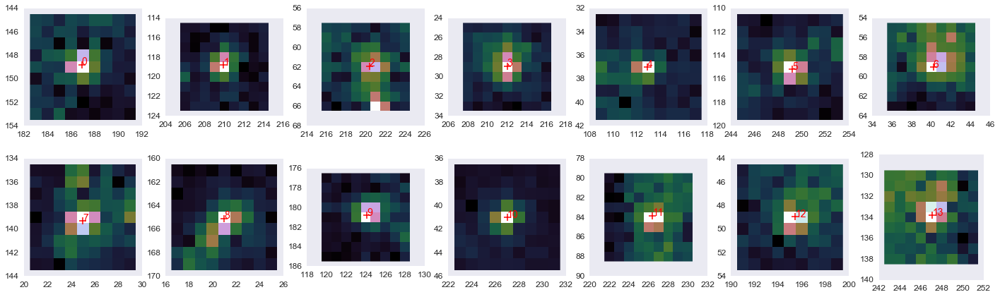

In [32]:
points_unpatched = \
    [(186.9, 148.8),
     (209.9, 118.8),
     (220.4, 61.9),
     (212., 28.9),
     (112.9, 37.),
     (249.2, 115.2),
     (40.2, 59),
     (25, 139.3),
     (21, 165.1),
     (124.1, 180.8),
     (227, 41),
     (226.39516129032253, 83.846774193548384),
     (195.43468705265894, 48.93966400999318),
     (247.1, 133.8),
    ]
    
nrows = 2
npoints = len(points_unpatched)
even_npoints = npoints if npoints % 2 == 0 else npoints + 1
ncols = even_npoints // 2

fig, ax = plt.subplots(nrows, ncols, figsize=(3.5*ncols, 3.5*nrows))
axr = ax.ravel()
for ip, point in enumerate(points_unpatched):
    rpoint = np.round(point)
    roi = tt.get_roi_square(rpoint, pad=4)
    axr[ip].imshow(frame[roi], cmap='cubehelix', interpolation='none',
                   extent=(roi[1].start-0.5, roi[1].stop-0.5, roi[0].stop-0.5, roi[0].start-0.5))
    axr[ip].plot(point[0], point[1], 'r+', ms=10, mew=1.5)
    axr[ip].annotate('%d' % ip, point, color='red', fontsize=14)

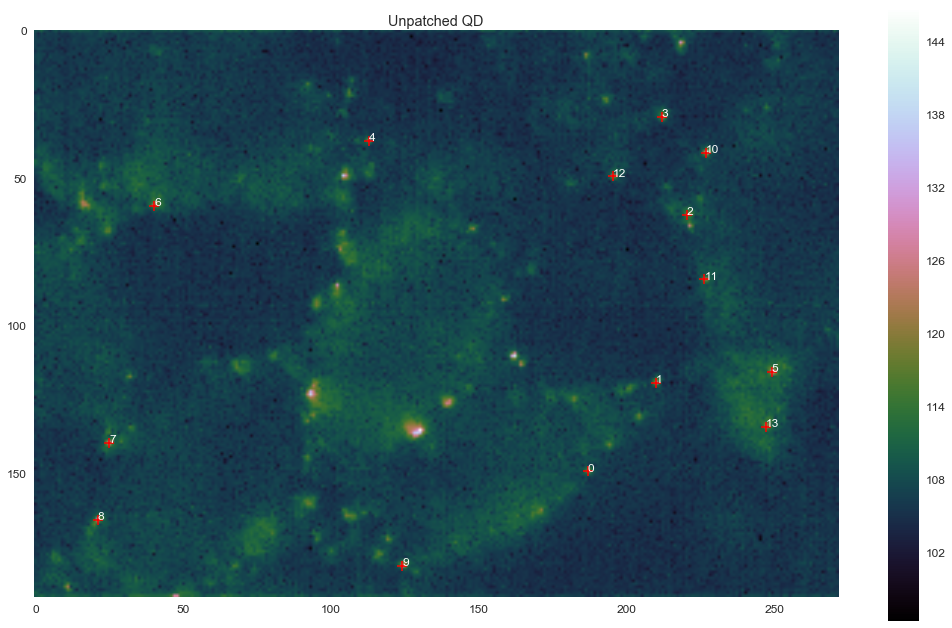

In [33]:
fig, ax = plt.subplots(figsize=(18, 11))
for ip, point in enumerate(points_unpatched):
    plt.plot(point[0], point[1], 'r+', ms=10, mew=1.5)
    plt.annotate('%d' % ip, point, color='white', fontsize=12)
im = ax.imshow(data.video.mean(0), cmap='cubehelix')
plt.colorbar(im);
ax.set_title('Unpatched QD');

### QDs selection: non-nearest neighbour cell

In [34]:
ipoints_unpatched_sel = (2, 3, 5, 10, 11, 12, 13)
points_unpatched_sel = [points_unpatched[i] for i in ipoints_unpatched_sel]

## Test round ROI

In [35]:
sns.set_style('darkgrid')

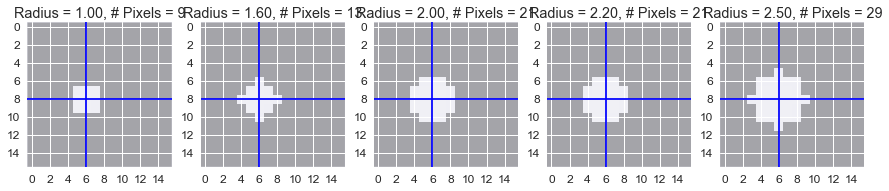

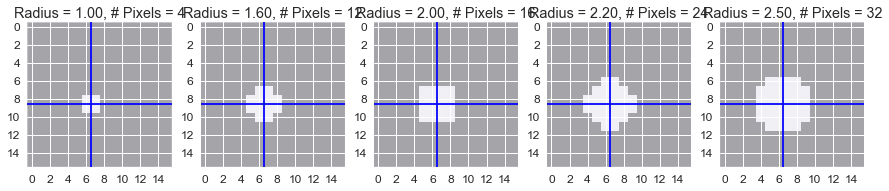

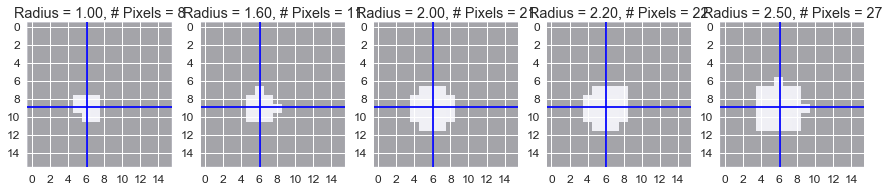

In [36]:
shape2d = (16, 16)
radii = [1, 1.6, 2, 2.2, 2.5]
point = (6, 8)

fig, ax = plt.subplots(1, len(radii), figsize=(3*len(radii), 3))
for i, clip_radius in enumerate(radii):
    mask = tt.get_roi_circle(point, clip_radius, shape2d)
    a = np.zeros(shape2d)
    a[mask] = 1
    im = ax[i].imshow(a, interpolation='none', cmap='gray', alpha=0.3)
    ax[i].axvline(point[0])
    ax[i].axhline(point[1])
    ax[i].set_title('Radius = %.2f, # Pixels = %d' % (clip_radius, len(mask[0])))
    
point = (point[0]+0.5, point[1]+0.5)
fig, ax = plt.subplots(1, len(radii), figsize=(3*len(radii), 3))
for i, clip_radius in enumerate(radii):
    mask = tt.get_roi_circle(point, clip_radius, shape2d)
    a = np.zeros(shape2d)
    a[mask] = 1
    im = ax[i].imshow(a, interpolation='none', cmap='gray', alpha=0.3)
    ax[i].axvline(point[0])
    ax[i].axhline(point[1])
    ax[i].set_title('Radius = %.2f, # Pixels = %d' % (clip_radius, len(mask[0])))

point = (point[0]-0.4, point[1]+0.4)
fig, ax = plt.subplots(1, len(radii), figsize=(3*len(radii), 3))
for i, clip_radius in enumerate(radii):
    mask = tt.get_roi_circle(point, clip_radius, shape2d)
    a = np.zeros(shape2d)
    a[mask] = 1
    im = ax[i].imshow(a, interpolation='none', cmap='gray', alpha=0.3)
    ax[i].axvline(point[0])
    ax[i].axhline(point[1])
    ax[i].set_title('Radius = %.2f, # Pixels = %d' % (clip_radius, len(mask[0])))

## ROIs for patched QDs

In [37]:
sns.set_style('dark')

C:\Users\laser2002j\Miniconda3\envs\voltagesensing_env_py3\lib\site-packages\ipykernel\__main__.py:14: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
C:\Users\laser2002j\Miniconda3\envs\voltagesensing_env_py3\lib\site-packages\ipykernel\__main__.py:22: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


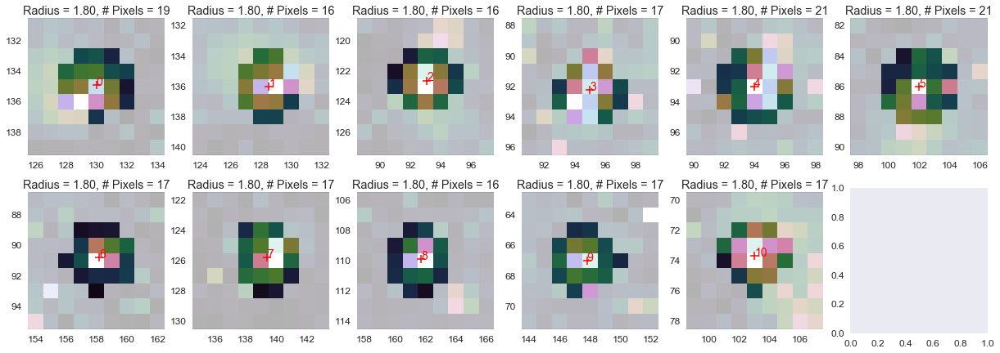

In [38]:
shape2d = (9, 9)
clip_radius = 1.8

nrows = 2
npoints = len(points_patched)
even_npoints = npoints if npoints % 2 == 0 else npoints + 1
ncols = even_npoints // 2

fig, ax = plt.subplots(nrows, ncols, figsize=(3.5*ncols, 3.5*nrows))
axr = ax.ravel()
for ip, point in enumerate(points_patched):
    rpoint = np.round(point)
    roi = tt.get_roi_square(rpoint, pad=(shape2d[0]-1)//2)
    axr[ip].imshow(hp_frame[roi], cmap='cubehelix', interpolation='none',
                   extent=(roi[1].start-0.5, roi[1].stop-0.5, roi[0].stop-0.5, roi[0].start-0.5))
    axr[ip].plot(point[0], point[1], 'r+', ms=10, mew=1.5)
    axr[ip].annotate('%d' % ip, point, color='red', fontsize=14)
    
    mask = tt.get_roi_circle(point, clip_radius, frame.shape)
    a = np.ones(frame.shape)
    a[mask] = 0
    im = axr[ip].imshow(a[roi], interpolation='none', cmap='gray', vmin=0.5, alpha=0.7,
                        extent=(roi[1].start-0.5, roi[1].stop-0.5, roi[0].stop-0.5, roi[0].start-0.5))
    im.cmap.set_under(alpha=0)
    axr[ip].set_title('Radius = %.2f, # Pixels = %d' % (clip_radius, len(mask[0])))

## ROIs for unpatched QDs

C:\Users\laser2002j\Miniconda3\envs\voltagesensing_env_py3\lib\site-packages\ipykernel\__main__.py:14: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
C:\Users\laser2002j\Miniconda3\envs\voltagesensing_env_py3\lib\site-packages\ipykernel\__main__.py:22: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


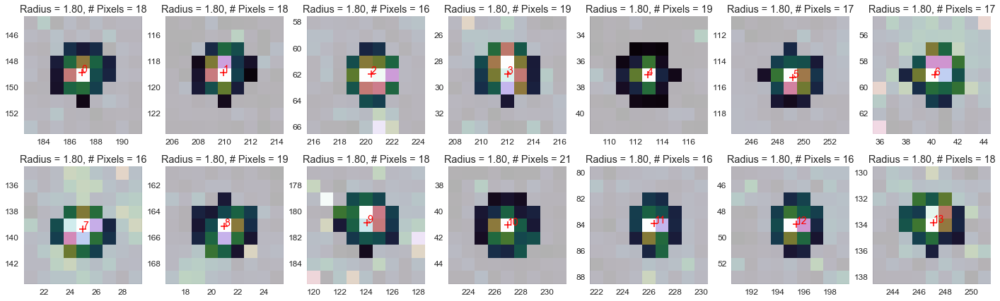

In [39]:
shape2d = (9, 9)
clip_radius = 1.8

nrows = 2
npoints = len(points_unpatched)
even_npoints = npoints if npoints % 2 == 0 else npoints + 1
ncols = even_npoints // 2

fig, ax = plt.subplots(nrows, ncols, figsize=(3.5*ncols, 3.5*nrows))
axr = ax.ravel()
for ip, point in enumerate(points_unpatched):
    rpoint = np.round(point)
    roi = tt.get_roi_square(rpoint, pad=(shape2d[0]-1)//2)
    axr[ip].imshow(hp_frame[roi], cmap='cubehelix', interpolation='none',
                   extent=(roi[1].start-0.5, roi[1].stop-0.5, roi[0].stop-0.5, roi[0].start-0.5))
    axr[ip].plot(point[0], point[1], 'r+', ms=10, mew=1.5)
    axr[ip].annotate('%d' % ip, point, color='red', fontsize=14)
    
    mask = tt.get_roi_circle(point, clip_radius, frame.shape)
    a = np.ones(frame.shape)
    a[mask] = 0
    im = axr[ip].imshow(a[roi], interpolation='none', cmap='gray', vmin=0.5, alpha=0.7,
                        extent=(roi[1].start-0.5, roi[1].stop-0.5, roi[0].stop-0.5, roi[0].start-0.5))
    im.cmap.set_under(alpha=0)
    axr[ip].set_title('Radius = %.2f, # Pixels = %d' % (clip_radius, len(mask[0])))

In [40]:
sns.set_style('darkgrid')

# 4. QD Timetraces

The following plot shows the effect of the detrending filter on a timetrace:

In [41]:
detrend_sigma = 300

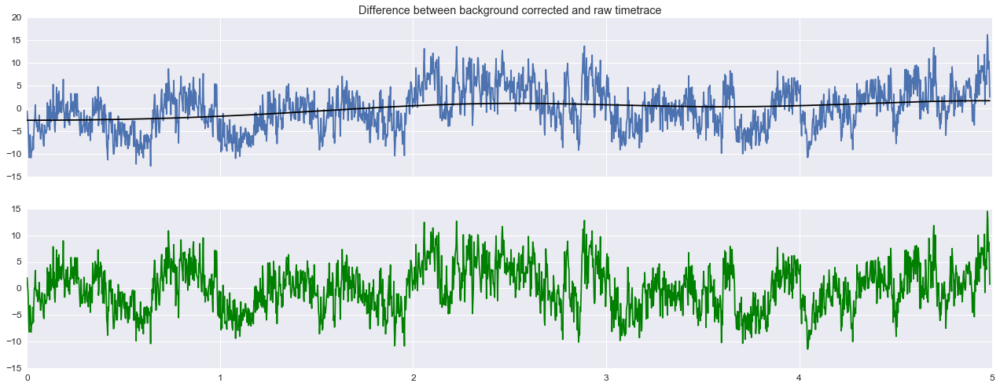

In [42]:
point = points_patched[1]

fig, ax = plt.subplots(2, 1, figsize=(22, 8), sharex=True)
timetracer = tt.get_timetrace(data.video, point, clip_radius=clip_radius, detrend_sigma=None)
trend = ndi.filters.gaussian_filter1d(timetracer, detrend_sigma)

ax[0].plot(data.time, timetracer, label='Raw timetrace')
ax[0].plot(data.time, trend, color='k', label='Low-pass version')
ax[1].plot(data.time, timetracer - trend, color='g', label='Raw timetrace - low-pass version')

ax[0].set_title('Difference between background corrected and raw timetrace');

Detrended timetraces (*various colors*) and smoothed (low-pass) versions (*black*) used to identify blinking periods. The plots show the OFF-periods as lighter-colored timetrace chunks. The first set of plots is for patched QDs, the second for unpatched QDs.

In [43]:
colors = sns.color_palette('deep', max(len(points_patched), len(points_unpatched)))

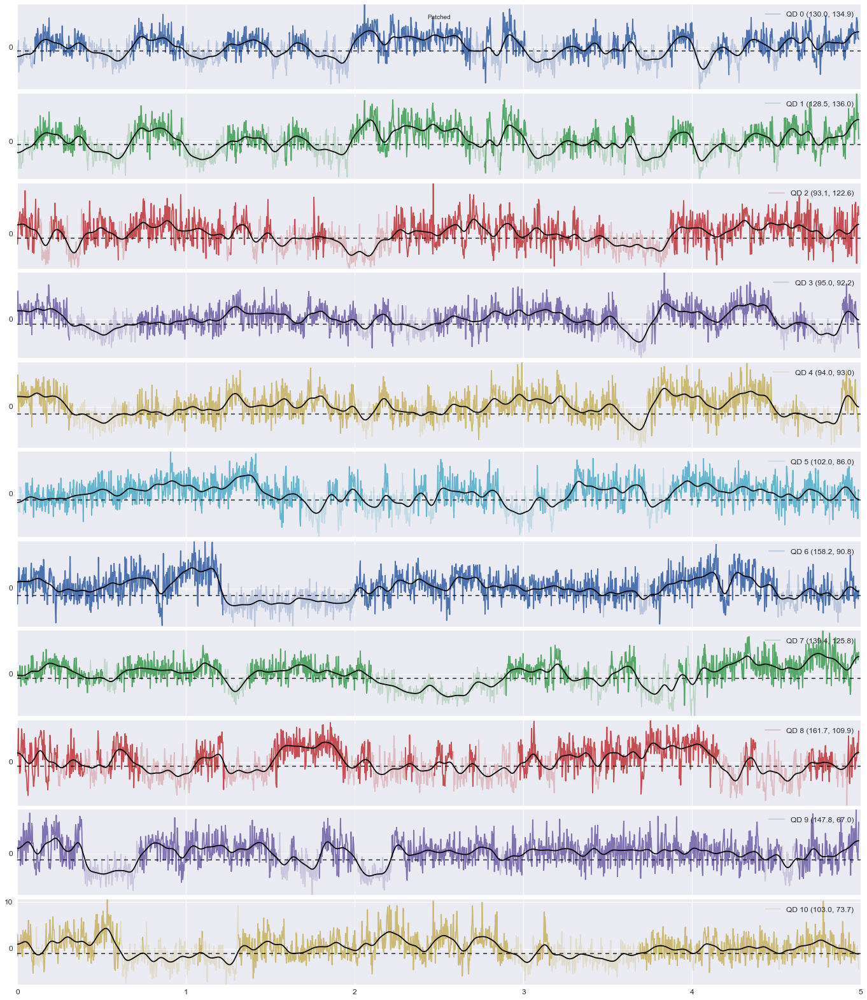

In [44]:
clip_radius = 1.8
detrend_sigma = 300
lowpass_sigma = 10
thresholds = [-1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1]

points_sel = points_patched
fig, ax = plt.subplots(len(points_sel), 1, figsize=(20, 2*len(points_sel)), sharex=True)
fig.tight_layout()
fig.suptitle('Patched')
fig.subplots_adjust(left=0.04, right=0.96, hspace=0.05)
for i, point in enumerate(points_sel):
    timetrace = tt.get_timetrace(data.video, point, clip_radius=clip_radius, detrend_sigma=detrend_sigma)
    ftimetrace = ndi.filters.gaussian_filter1d(timetrace, 10)
    on_periods = tt.get_on_periods_slices(timetrace, thresholds[i], lowpass_sigma=lowpass_sigma, align=4)
    
    ax[i].plot(data.time, timetrace, color=colors[i], alpha=0.3,
               label='QD %d (%.1f, %.1f)' % (i, point[0], point[1]))
    for on_period in on_periods:
        ax[i].plot(data.time[on_period], timetrace[on_period], color=colors[i], alpha=1)
    #ax[i].plot(data.time[time_on], trace_on, '.', color=colors[i], alpha=1)
    ax[i].plot(data.time, ftimetrace, color='k')
    ax[i].axhline(thresholds[i], color='k', ls='--', alpha=0.7)
    ax[i].locator_params(axis='y', tight=True, nbins=2)
    ax[i].legend()

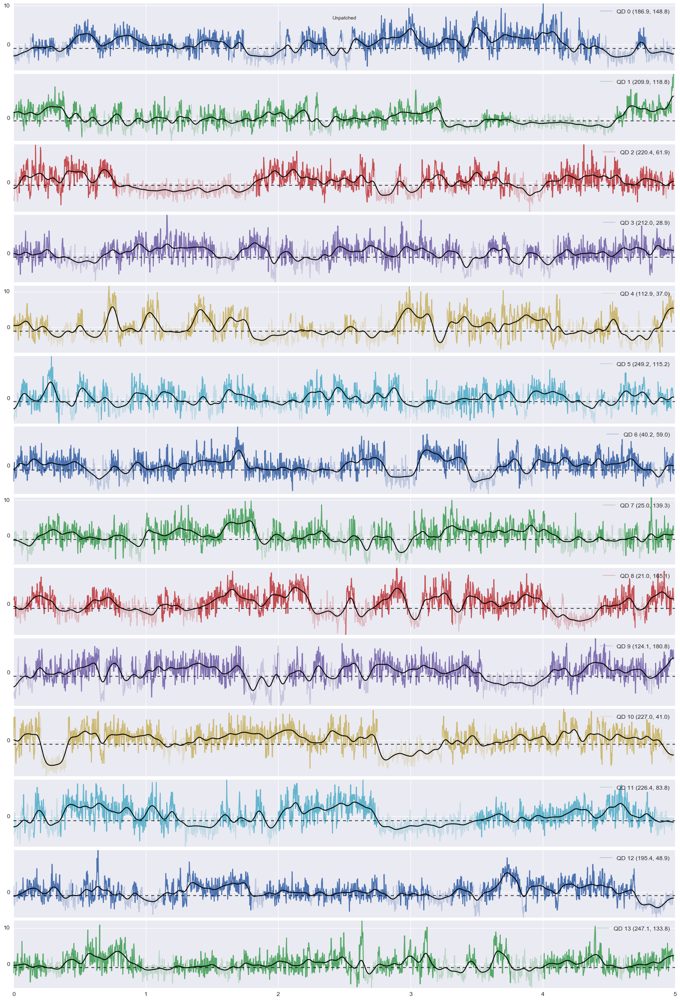

In [45]:
points_sel = points_unpatched

fig, ax = plt.subplots(len(points_sel), 1, figsize=(20, 2*len(points_sel)), sharex=True)
fig.tight_layout()
fig.suptitle('Unpatched')
fig.subplots_adjust(left=0.04, right=0.96, hspace=0.05)
for i, point in enumerate(points_sel):
    timetrace = tt.get_timetrace(data.video, point, clip_radius=clip_radius, detrend_sigma=detrend_sigma)
    ftimetrace = ndi.filters.gaussian_filter1d(timetrace, 10)
    on_periods = tt.get_on_periods_slices(timetrace, thresholds[i], lowpass_sigma=lowpass_sigma, align=4)
    
    ax[i].plot(data.time, timetrace, color=colors[i], alpha=0.3,
               label='QD %d (%.1f, %.1f)' % (i, point[0], point[1]))
    for on_period in on_periods:
        ax[i].plot(data.time[on_period], timetrace[on_period], color=colors[i], alpha=1)
    #ax[i].plot(data.time[time_on], trace_on, '.', color=colors[i], alpha=1)
    ax[i].plot(data.time, ftimetrace, color='k')
    ax[i].axhline(thresholds[i], color='k', ls='--', alpha=0.7)
    ax[i].locator_params(axis='y', tight=True, nbins=2)
    ax[i].legend()

## Export timetraces

Here we export all the timetraces to text files to allow analysis from third party tools:

In [46]:
clip_radius

1.8

In [47]:
for patched in [True, False]:
    label = 'Patched' if patched else 'Unpatched'

    points_sel = points_patched if patched else points_unpatched

    for ipoint, point in enumerate(points_sel):
        name = '%s Full Timetrace %s QD %d (%d, %d) radius %.1f' % (dataset_label, label, ipoint, point[0], point[1], clip_radius)
        resname = 'results/%s.csv' % name

        timetracer = tt.get_timetrace(data.video, point=point, clip_radius=clip_radius, detrend_sigma=None, zero_mean=False)
        np.savetxt(resname, timetracer)

# 5. Fluorescence alternation analysis

## Signal: Alternated differences

Given a timetrace $\{t_k\}$, where $t_k$ is the ROI-average in the $k$-th frame, the signal is compute as follows:

1. compute the 2-frame average timetrace $\{t'_i\}$, where $t'_i = (t_{2i} + t_{2i + 1})/2$
2. compute $\{d_1, d_2, d_3, d_4, ...\} = \{(t'_0 - t'_1),\; -(t'_2 - t'_1),\; (t'_3 - t'_2),\; -(t'_4 - t'_3)....\}$, which is the finite-difference with alternated sign. 
3. for the out-of-phase case, points (1) and (2) are repeated dropping the first element from $\{t_k\}$

> This signal is computed by functions `tt.edge_diff_all()`.

## N-elements averages

The *n*-cycles average is computed as a *n*-elements running (or block) average on the array $\{d_i\}$.

### Implementation

Call `tt.avg_nsamples()` passing the array $\{d_i\}$ previously computed via `tt.edge_diff_all()` ([see definition](#Signal:-Alternated-differences)). 


## Simulated test signal

In [48]:
f0 = 100
sim_signal = 1 + np.cos(2*np.pi*f0*data.time - np.pi/4)

In [49]:
sns.set_style('darkgrid')
sns.set_context('notebook', font_scale=1.2)

## 1-period Mean, Std, SNR

In [50]:
ncycles = 2   # --> 2 sample average is 1 modulation period
running_avg = False
clip_radius = 1.8
detrend_sigma = 300

In [51]:
patched = True

if patched:
    points_sel = points_patched
else:
    points_sel = points_unpatched

n_mean_diff, n_mean_diffo = np.zeros(len(points_sel)), np.zeros(len(points_sel))
n_std_diff, n_std_diffo = np.zeros(len(points_sel)), np.zeros(len(points_sel))
timetrace_mean = np.zeros(len(points_sel))
for ip, point in enumerate(points_sel):
    timetrace, timetrace_mean[ip] = tt.get_timetrace(
        data.video, point=point, clip_radius=clip_radius, detrend_sigma=detrend_sigma, return_mean=True)
    #timetrace_on = timetrace
    time_on, timetrace_on = tt.get_on_periods_timetrace(timetrace, thresholds[ip], lowpass_sigma=10, align=4)

    all_diff = tt.edge_diff_all(timetrace_on)
    all_diffo = tt.edge_diff_all(timetrace_on, offset=1)
    n_all_diff = tt.avg_nsamples(all_diff, num_samples=ncycles, running_avg=running_avg)
    n_all_diffo = tt.avg_nsamples(all_diffo, num_samples=ncycles, running_avg=running_avg)

    n_mean_diff[ip], n_mean_diffo[ip] = n_all_diff.mean(), n_all_diffo.mean()
    n_std_diff[ip], n_std_diffo[ip] = n_all_diff.std(), n_all_diffo.std()

name = '%d-cycles avg of alternated diff' % ncycles
fig, ax = plt.subplots(1, 4, figsize=(24, 4))
ax[0].plot(n_mean_diff, '-o', mew=0, ms=6, label='in-phase')
ax[0].plot(n_mean_diffo, '-o', mew=0, ms=6, label='out-of-phase')
ax[0].set_title('Mean of (%s)' % name)
ax[1].plot(n_std_diff, '-o', mew=0, ms=6, label='in-phase')
ax[1].plot(n_std_diffo, '-o', mew=0, ms=6, label='out-of-phase')
ax[1].set_title('Std.Dev. of (%s)' % name)
ax[2].plot(n_mean_diff/n_std_diff, '-o', mew=0, ms=6, label='in-phase')
ax[2].plot(n_mean_diffo/n_std_diffo, '-o', mew=0, ms=6, label='out-of-phase')
ax[2].set_title('SNR of (%s)' % name)
ax[3].plot(n_mean_diff/timetrace_mean*100, '-o', mew=0, ms=6, label='in-phase')
ax[3].plot(n_mean_diffo/timetrace_mean*100, '-o', mew=0, ms=6, label='out-of-phase')
ax[3].set_ylabel('Percentage (%)')
ax[3].set_title('Signal / mean(timetrace)')
ax[1].set_xlabel('Quantum Dot')
ax[3].legend(ncol=2)
plt.close(fig)
if patched:
    fig.suptitle('Patched, %d-cycles average' % ncycles);
    fig_patched = fig
else:
    fig.suptitle('Unpatched, %d-cycles average' % ncycles);
    fig_unpatched = fig

In [52]:
patched = False

if patched:
    points_sel = points_patched
else:
    points_sel = points_unpatched

n_mean_diff, n_mean_diffo = np.zeros(len(points_sel)), np.zeros(len(points_sel))
n_std_diff, n_std_diffo = np.zeros(len(points_sel)), np.zeros(len(points_sel))
timetrace_mean = np.zeros(len(points_sel))
for ip, point in enumerate(points_sel):
    timetrace, timetrace_mean[ip] = tt.get_timetrace(
        data.video, point=point, clip_radius=clip_radius, detrend_sigma=detrend_sigma, return_mean=True)
    #timetrace_on = timetrace
    time_on, timetrace_on = tt.get_on_periods_timetrace(timetrace, thresholds[ip], lowpass_sigma=10, align=4)

    all_diff = tt.edge_diff_all(timetrace_on)
    all_diffo = tt.edge_diff_all(timetrace_on, offset=1)
    n_all_diff = tt.avg_nsamples(all_diff, num_samples=ncycles, running_avg=running_avg)
    n_all_diffo = tt.avg_nsamples(all_diffo, num_samples=ncycles, running_avg=running_avg)

    n_mean_diff[ip], n_mean_diffo[ip] = n_all_diff.mean(), n_all_diffo.mean()
    n_std_diff[ip], n_std_diffo[ip] = n_all_diff.std(), n_all_diffo.std()

name = '%d-cycles avg of alternated diff' % ncycles
fig, ax = plt.subplots(1, 4, figsize=(24, 4))
ax[0].plot(n_mean_diff, '-o', mew=0, ms=6, label='in-phase')
ax[0].plot(n_mean_diffo, '-o', mew=0, ms=6, label='out-of-phase')
ax[0].set_title('Mean of (%s)' % name)
ax[1].plot(n_std_diff, '-o', mew=0, ms=6, label='in-phase')
ax[1].plot(n_std_diffo, '-o', mew=0, ms=6, label='out-of-phase')
ax[1].set_title('Std.Dev. of (%s)' % name)
ax[2].plot(n_mean_diff/n_std_diff, '-o', mew=0, ms=6, label='in-phase')
ax[2].plot(n_mean_diffo/n_std_diffo, '-o', mew=0, ms=6, label='out-of-phase')
ax[2].set_title('SNR of (%s)' % name)
ax[3].plot(n_mean_diff/timetrace_mean*100, '-o', mew=0, ms=6, label='in-phase')
ax[3].plot(n_mean_diffo/timetrace_mean*100, '-o', mew=0, ms=6, label='out-of-phase')
ax[3].set_ylabel('Percentage (%)')
ax[3].set_title('Signal / mean(timetrace)')
ax[1].set_xlabel('Quantum Dot')
ax[3].legend(ncol=2)
plt.close(fig)
if patched:
    fig.suptitle('Patched, %d-cycles average' % ncycles);
    fig_patched = fig
else:
    fig.suptitle('Unpatched, %d-cycles average' % ncycles);
    fig_unpatched = fig

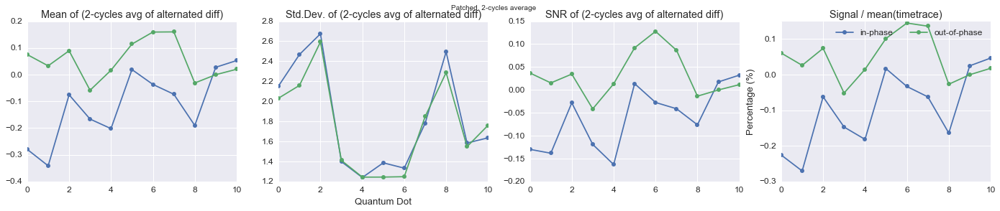

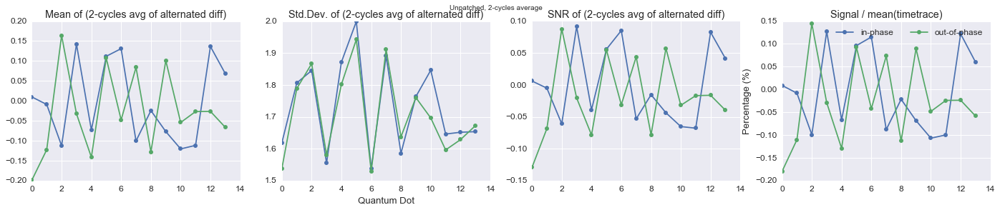

In [53]:
display(fig_patched)
display(fig_unpatched)

### Figure caption
Using [the previous definition of signal](#Signal:-Alternated-differences) the figure shows:

- (*column 1*) $\textrm{mean}(\{d_i\})$
- (*column 2*) $\textrm{std_dev}(\{d_i\})$
- (*column 3*) $\textrm{mean}(\{d_i\})/\textrm{std_dev}(\{d_i\})$
- (*column 4*) $\textrm{mean}(\{d_i\})/\textrm{mean}(\{t_k\})$

## N-period Mean, Std, SNR

In [54]:
ncycles = 16
running_avg = False
clip_radius = 1.8
detrend_sigma = 300

In [55]:
import pandas as pd

In [56]:
patched = True

if patched:
    points_sel = points_patched
else:
    points_sel = points_unpatched

n_mean_diff, n_mean_diffo = np.zeros(len(points_sel)), np.zeros(len(points_sel))
n_std_diff, n_std_diffo = np.zeros(len(points_sel)), np.zeros(len(points_sel))
timetrace_mean = np.zeros(len(points_sel))
for ip, point in enumerate(points_sel):
    timetrace, timetrace_mean[ip] = tt.get_timetrace(
        data.video, point=point, clip_radius=clip_radius, detrend_sigma=detrend_sigma, return_mean=True)
    #timetrace_on = timetrace
    time_on, timetrace_on = tt.get_on_periods_timetrace(timetrace, thresholds[ip], lowpass_sigma=10, align=4)

    all_diff = tt.edge_diff_all(timetrace_on)
    all_diffo = tt.edge_diff_all(timetrace_on, offset=1)
    n_all_diff = tt.avg_nsamples(all_diff, num_samples=ncycles, running_avg=running_avg)
    n_all_diffo = tt.avg_nsamples(all_diffo, num_samples=ncycles, running_avg=running_avg)

    n_mean_diff[ip], n_mean_diffo[ip] = n_all_diff.mean(), n_all_diffo.mean()
    n_std_diff[ip], n_std_diffo[ip] = n_all_diff.std(), n_all_diffo.std()

name = '%d-cycles avg of alternated diff' % ncycles
fig, ax = plt.subplots(1, 4, figsize=(24, 4))
ax[0].plot(n_mean_diff, '-o', mew=0, ms=6, label='in-phase')
ax[0].plot(n_mean_diffo, '-o', mew=0, ms=6, label='out-of-phase')
ax[0].set_title('Mean of (%s)' % name)
ax[1].plot(n_std_diff, '-o', mew=0, ms=6, label='in-phase')
ax[1].plot(n_std_diffo, '-o', mew=0, ms=6, label='out-of-phase')
ax[1].set_title('Std.Dev. of (%s)' % name)
ax[2].plot(n_mean_diff/n_std_diff, '-o', mew=0, ms=6, label='in-phase')
ax[2].plot(n_mean_diffo/n_std_diffo, '-o', mew=0, ms=6, label='out-of-phase')
ax[2].set_title('SNR of (%s)' % name)
ax[3].plot(n_mean_diff/timetrace_mean*100, '-o', mew=0, ms=6, label='in-phase')
ax[3].plot(n_mean_diffo/timetrace_mean*100, '-o', mew=0, ms=6, label='out-of-phase')
ax[3].set_ylabel('Percentage (%)')
ax[3].set_title('Mean signal / mean(timetrace)')
ax[1].set_xlabel('Quantum Dot')
ax[3].legend(ncol=2)
ax[3].set_ylim(-0.3, 0.3)
plt.close(fig)
if patched:
    fig.suptitle('Patched, %d-cycles average' % ncycles);
    fig_patched = fig
    dpatched = pd.DataFrame(dict(n_mean_diff=n_mean_diff,
                                 n_mean_diffo=n_mean_diffo,
                                 timetrace_mean=timetrace_mean))
else:
    fig.suptitle('Unpatched, %d-cycles average' % ncycles);
    fig_unpatched = fig
    dunpatched = pd.DataFrame(dict(n_mean_diff=n_mean_diff,
                                   n_mean_diffo=n_mean_diffo,
                                   timetrace_mean=timetrace_mean))

In [57]:
patched = False

if patched:
    points_sel = points_patched
else:
    points_sel = points_unpatched

n_mean_diff, n_mean_diffo = np.zeros(len(points_sel)), np.zeros(len(points_sel))
n_std_diff, n_std_diffo = np.zeros(len(points_sel)), np.zeros(len(points_sel))
timetrace_mean = np.zeros(len(points_sel))
for ip, point in enumerate(points_sel):
    timetrace, timetrace_mean[ip] = tt.get_timetrace(
        data.video, point=point, clip_radius=clip_radius, detrend_sigma=detrend_sigma, return_mean=True)
    #timetrace_on = timetrace
    time_on, timetrace_on = tt.get_on_periods_timetrace(timetrace, thresholds[ip], lowpass_sigma=10, align=4)

    all_diff = tt.edge_diff_all(timetrace_on)
    all_diffo = tt.edge_diff_all(timetrace_on, offset=1)
    n_all_diff = tt.avg_nsamples(all_diff, num_samples=ncycles, running_avg=running_avg)
    n_all_diffo = tt.avg_nsamples(all_diffo, num_samples=ncycles, running_avg=running_avg)

    n_mean_diff[ip], n_mean_diffo[ip] = n_all_diff.mean(), n_all_diffo.mean()
    n_std_diff[ip], n_std_diffo[ip] = n_all_diff.std(), n_all_diffo.std()

name = '%d-cycles avg of alternated diff' % ncycles
fig, ax = plt.subplots(1, 4, figsize=(24, 4))
ax[0].plot(n_mean_diff, '-o', mew=0, ms=6, label='in-phase')
ax[0].plot(n_mean_diffo, '-o', mew=0, ms=6, label='out-of-phase')
ax[0].set_title('Mean of (%s)' % name)
ax[1].plot(n_std_diff, '-o', mew=0, ms=6, label='in-phase')
ax[1].plot(n_std_diffo, '-o', mew=0, ms=6, label='out-of-phase')
ax[1].set_title('Std.Dev. of (%s)' % name)
ax[2].plot(n_mean_diff/n_std_diff, '-o', mew=0, ms=6, label='in-phase')
ax[2].plot(n_mean_diffo/n_std_diffo, '-o', mew=0, ms=6, label='out-of-phase')
ax[2].set_title('SNR of (%s)' % name)
ax[3].plot(n_mean_diff/timetrace_mean*100, '-o', mew=0, ms=6, label='in-phase')
ax[3].plot(n_mean_diffo/timetrace_mean*100, '-o', mew=0, ms=6, label='out-of-phase')
ax[3].set_ylabel('Percentage (%)')
ax[3].set_title('Mean signal / mean(timetrace)')
ax[1].set_xlabel('Quantum Dot')
ax[3].legend(ncol=2)
ax[3].set_ylim(-0.3, 0.3)
plt.close(fig)
if patched:
    fig.suptitle('Patched, %d-cycles average' % ncycles);
    fig_patched = fig
    dpatched = pd.DataFrame(dict(n_mean_diff=n_mean_diff,
                                 n_mean_diffo=n_mean_diffo,
                                 timetrace_mean=timetrace_mean))
else:
    fig.suptitle('Unpatched, %d-cycles average' % ncycles);
    fig_unpatched = fig
    dunpatched = pd.DataFrame(dict(n_mean_diff=n_mean_diff,
                                   n_mean_diffo=n_mean_diffo,
                                   timetrace_mean=timetrace_mean))

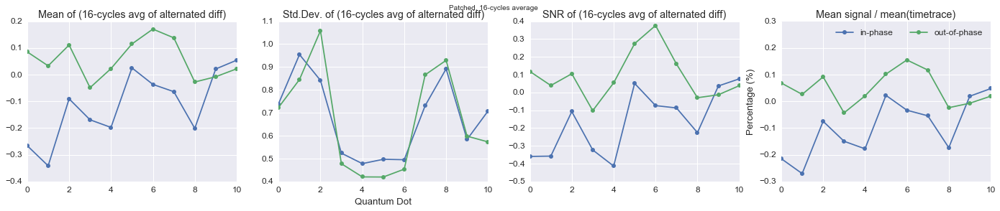

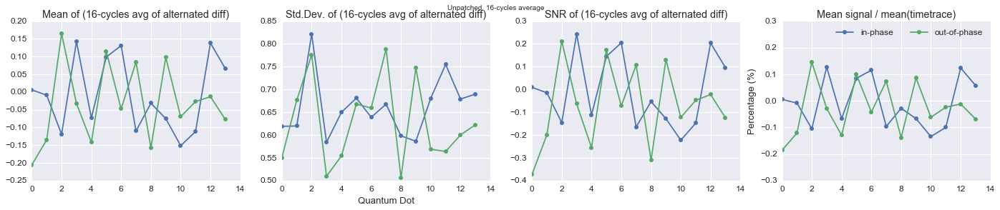

In [58]:
display(fig_patched)
display(fig_unpatched)

### N-periods average figure caption

We compute the signal $\{d_i\}$ as the alternated differences as [the previously defined](#Signal:-Alternated-differences). Then we $\{r_i\}$ as the running average of $\{d_i\}$ using `ncycles` samples window.
With this definition the figure columns shows

- (*column 1*) $\textrm{mean}(\{r_i\})$
- (*column 2*) $\textrm{std_dev}(\{r_i\})$
- (*column 3*) $\textrm{mean}(\{r_i\})/\textrm{std_dev}(\{d_i\})$
- (*column 4*) $\textrm{mean}(\{r_i\})/\textrm{mean}(\{t_k\})$

The results obtained with the running average are in line with the [previous plot](#1-period-Mean,-Std,-SNR) where no running average was performed. From both plots we can observe that the in-phase signal is distinctly separated from the out-of-phase one for the patched QDs, while in-phase and out-of-phase are intermixed for the unpatched Qds. This suggests that for the unpatched QDs we observe basically random fluctuations, while for patched QDs there is a clear trend of a more negative signal indicating correlation with the alternating voltage. However, even for the patched QDs the signal is relatively low and out of 10 QDs only for 5 (0, 1, 3, 4, and 8) exhibit an absolute signal significantly higher than the noise level.

### Unpatched QD 0

A peculiarity is exhibited by the unpatched QD 0. We observe a moderately high signal for the out-of-phase alternation and a basically 0 signal for the in-phase. We speculate that this peculiar behaviour can be due to a delayed electrical signal propagating from the patched cell to the adjacent cell where unpatched QD 0 lies. In the spiking cell assay we observed a cell-to-cell delay of electrical signal compatible with the 5 ms (half period) supposedly observed here. We don't have, however, enough statistical ground to support this hypothesis beyond a pure speculation at this point.


### Plot for the paper SI

In [59]:
sns.set_style('ticks')
sns.set_context('notebook', font_scale=1.2)

In [60]:
blue = '#87aade'# '#5f8dd3'
green = '#2ca02c'

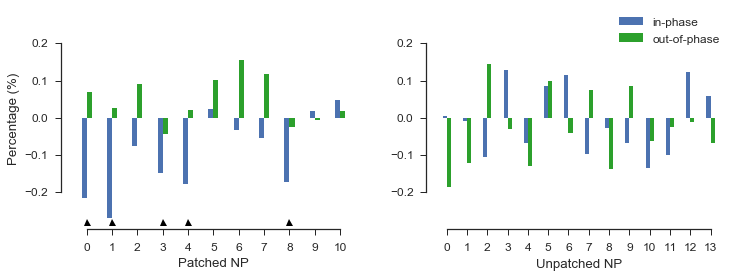

In [61]:
yp = dpatched['n_mean_diff']/dpatched['timetrace_mean']*100
yu = dunpatched['n_mean_diff']/dunpatched['timetrace_mean']*100
ypo = dpatched['n_mean_diffo']/dpatched['timetrace_mean']*100
yuo = dunpatched['n_mean_diffo']/dunpatched['timetrace_mean']*100
xp = np.arange(yp.size)
xu = np.arange(yu.size)

w = 0.2  # bar width
o = 0.0  # bar distance from vertical tick
fig, ax = plt.subplots(1, 2, figsize=(12, 4), sharey=True)
ax[0].bar(xp - o - w, yp, w, ec='none', label='in-phase')
ax[0].bar(xp + o, ypo, w,  ec='none', fc=green, label='out-of-phase')
ax[0].plot([0,1,3,4,8], [-0.28]*5, '^k', ms=7)
ax[0].set_ylabel('Percentage (%)')
#ax[0].set_title('Mean signal / mean(timetrace)')
ax[0].set_xlabel('Patched NP')
ax[0].set_xticks(xp)
ax[0].set_xlim(-1, xp.size)

ax[1].bar(xu - o - w, yu, w, ec='none', label='in-phase')
ax[1].bar(xu + o, yuo, w, ec='none', fc=green, label='out-of-phase')
#ax[1].set_title('Mean signal / mean(timetrace)')
ax[1].set_xlabel('Unpatched NP')
ax[1].set_ylim(-0.3, 0.3)
ax[1].set_xticks(xu)
ax[1].set_xlim(-1, xu.size)
ax[1].legend()

sns.despine(fig=fig, ax=ax, offset=0, trim=True)
plt.savefig('paper_figures/SI_meansignal.png', dpi=180, bbox_inches='tight')

In [62]:
sns.set_style('darkgrid')
sns.set_context('notebook', font_scale=1)

# 6.  Signal vs time

In [63]:
def t_run(sample_diff, num_samples, running_avg):
    if running_avg:
        return np.arange(0, sample_diff.size)*2 + 0.5 + num_samples
    else:
        return np.arange(0, sample_diff.size)*2*num_samples + num_samples

In [64]:
points_sel = points_patched
ncycles = 8
running_avg = True
clip_radius = 1.8
detrend_sigma = 300

n_alt_diff, n_alt_diffo = [], []
for ip, point in enumerate(points_sel):
    timetrace = tt.get_timetrace(data.video, point=point, clip_radius=clip_radius, detrend_sigma=detrend_sigma)
    #timetrace += 0.5*sim_signal
    timetrace_on = timetrace
    #time_on, timetrace_on = tt.get_on_periods_timetrace(timetrace, thresholds[ip], lowpass_sigma=10, align=4)

    n_alt_diff.append(
        tt.avg_nsamples(tt.edge_diff_all(timetrace, offset=0), 
                        num_samples=ncycles, running_avg=running_avg))
    n_alt_diffo.append(
        tt.avg_nsamples(tt.edge_diff_all(timetrace, offset=1), 
                        num_samples=ncycles, running_avg=running_avg))
        
alpha = 0.8
name = '%d-cycles avg of 2-edges sum' % ncycles
fig, ax = plt.subplots(len(points_sel), 1, 
                       figsize=(18, 4*len(points_sel)),
                       sharex=False)
fig.tight_layout()
for ip, point in enumerate(points_sel):
    timetrace = tt.get_timetrace(data.video, point=point, clip_radius=clip_radius, detrend_sigma=detrend_sigma)
    signal_clue = n_alt_diff[ip]**2
    signal_clueo = n_alt_diffo[ip]**2
    ax[ip].plot(t_run(signal_clue, ncycles, running_avg), 
                signal_clue, label='QD %d: signal^2 (%d cycles) in-phase' % (ip, ncycles), alpha=alpha)
    ax[ip].plot(t_run(signal_clueo, ncycles, running_avg), 
                signal_clueo, label='QD %d: signal^2 (%d cycles) out-of-phase' % (ip, ncycles), alpha=alpha)

    ax2 = ax[ip].twinx()
    ax2.grid(False)
    ax2.plot(timetrace, 'k', alpha=0.3)
    ax2.set_ylim(-40)

    ax[0].set_title('Patched: %d-cycles average' % ncycles)
    ax[ip].legend(loc='upper left')
    #ax[ip].set_ylim(-0, 20)
plt.close(fig)
fig_patched = fig;

In [65]:
points_sel = points_unpatched

n_alt_diff, n_alt_diffo = [], []
for ip, point in enumerate(points_sel):
    timetrace = tt.get_timetrace(data.video, point=point, clip_radius=clip_radius, detrend_sigma=detrend_sigma)
    timetrace_on = timetrace
    #time_on, timetrace_on = tt.get_on_periods_timetrace(timetrace, thresholds[ip], lowpass_sigma=10, align=4)

    n_alt_diff.append(
        tt.avg_nsamples(tt.edge_diff_all(timetrace, offset=0), 
                        num_samples=ncycles, running_avg=running_avg))
    n_alt_diffo.append(
        tt.avg_nsamples(tt.edge_diff_all(timetrace, offset=1), 
                        num_samples=ncycles, running_avg=running_avg))
        

fig, ax = plt.subplots(len(points_sel), 1, 
                       figsize=(18, 4*len(points_sel)),
                       sharex=False)
fig.tight_layout()
for ip, point in enumerate(points_sel):
    timetrace = tt.get_timetrace(data.video, point=point, clip_radius=clip_radius, detrend_sigma=detrend_sigma)
    signal_clue = n_alt_diff[ip]**2 
    signal_clueo = n_alt_diffo[ip]**2
    ax[ip].plot(t_run(signal_clue, ncycles, running_avg), 
                signal_clue, label='QD %d: signal^2 (%d cycles) in-phase' % (ip, ncycles), alpha=alpha)
    ax[ip].plot(t_run(signal_clueo, ncycles, running_avg), 
                signal_clueo, label='QD %d: signal^2 (%d cycles) out-of-phase' % (ip, ncycles), alpha=alpha)
    
    ax2 = ax[ip].twinx()
    ax2.grid(False)
    ax2.plot(timetrace, 'k', alpha=0.3)
    ax2.set_ylim(-40)

    ax[0].set_title('Unpatched: %d-cycles average' % ncycles)
    ax[ip].legend(loc='upper left')
    #ax[ip].set_ylim(-0, 20)
plt.close(fig)
fig_unpatched = fig;

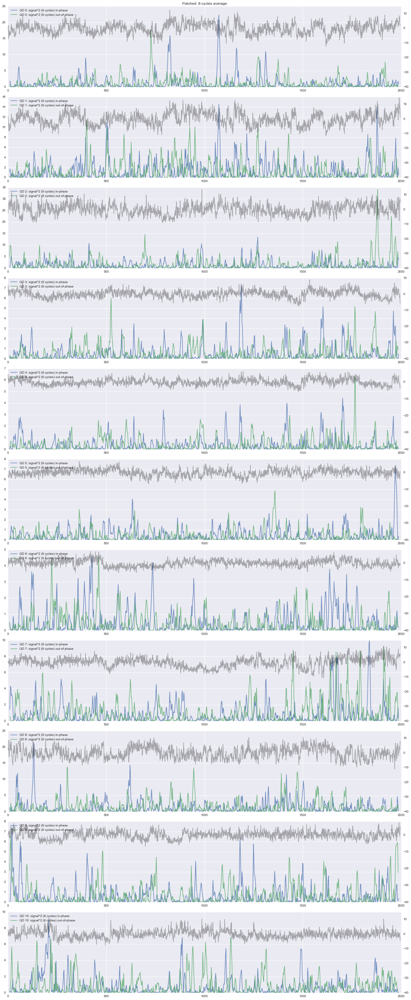

In [66]:
fig_patched

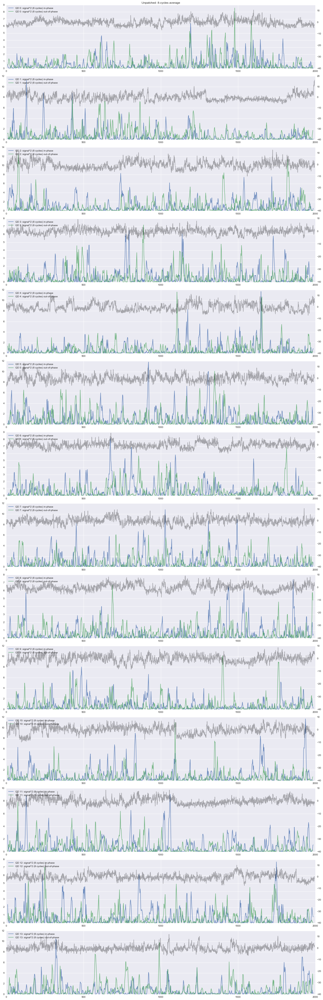

In [67]:
fig_unpatched

# 7. Signal vs time: burst search

In [68]:
from burstsearch import burstsearch_py
from timetraces import t_diffall, t_ravg

## QD selection for burst search

From section [QD on patched cell](#QD-on-patched-cell) we see that QD 0-1 and 3-4 are very close, and the [timetraces](#4.-QD-Timetraces) show that the signal is highly correlated. Therefore, in order to avoid over-representing these QDs (that may also be small clusters) QD 0 and 3 are excluded. Furthermore, the majority of QDs does not show any signal, so in order to avoid of being dominated by noise when aggregating the signal of different QDs, we select only the QD with mean absolute signal above signal 0.15. According to this criterion no unpatched QD would be selected, but 3 patched QDs survive the selection.

For the unpatched QDs, we selected only QDs on cells that are not nearest neighbours of the patched cell in order to avoid any possible leakage of the electric signal.

In [69]:
ipoints_patched = [1, 4, 8]
ipoints_unpatched = [2, 3, 5, 10, 11, 12, 13]

In [70]:
fraction = 0.6    # fraction of max signal to use as threhsold
bs_threshold = 4
ncycles = 12
pad = 5
running_avg = True
clip_radius = 1.8
detrend_sigma = 300

## Patched in-phase

C:\Data\Antonio\software\src\voltagesensing\figures\Take1 Full Timetrace Patched_inphase QD 1 (128, 136).png

Patched_inphase QD 1 Number of bursts: 8


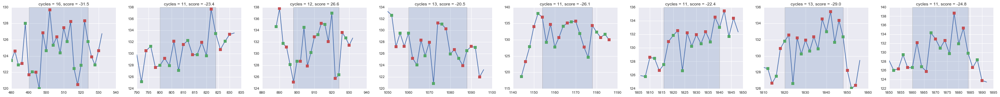

C:\Data\Antonio\software\src\voltagesensing\figures\Take1 Full Timetrace Patched_inphase QD 4 (94, 93).png

Patched_inphase QD 4 Number of bursts: 5


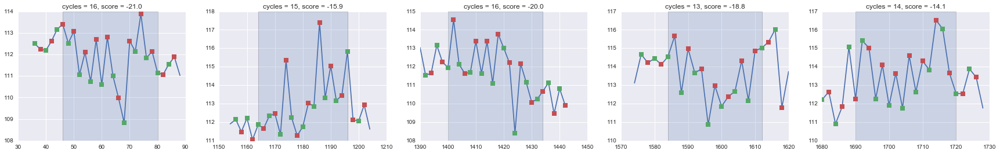

C:\Data\Antonio\software\src\voltagesensing\figures\Take1 Full Timetrace Patched_inphase QD 8 (161, 109).png

Patched_inphase QD 8 Number of bursts: 5


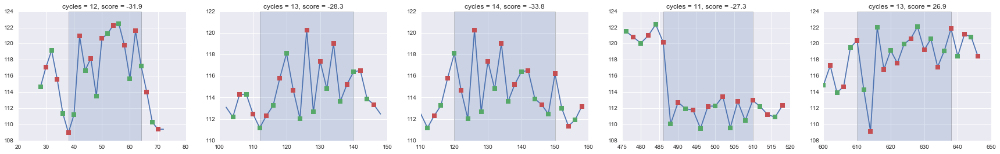

In [71]:
patched = True
inphase = True

label = 'Patched' if patched else 'Unpatched'
if inphase: label += '_inphase'
else: label += '_outphase'
points_sel = points_patched if patched else points_unpatched
ipoints = ipoints_patched if patched else ipoints_unpatched
offset = int(not inphase)

bursts_qd = []
for ipoint in ipoints:
    point = points_sel[ipoint]

    timetrace = tt.get_timetrace(data.video, point=point, clip_radius=clip_radius, detrend_sigma=detrend_sigma)
    timetracer = tt.get_timetrace(data.video, point=point, clip_radius=clip_radius, detrend_sigma=None, zero_mean=False)
    timetracem = tt.avg_nsamples(timetracer, 2, running_avg=False, offset=offset)
    t_timetrace = np.arange(timetrace.size)
    t_timetracem = np.arange(timetracem.size)*2 + offset
    t_ra = t_ravg(timetrace.size, inphase=inphase, num_samples=ncycles)
    t_da = t_diffall(timetrace.size, inphase=inphase)
    
    all_diff = tt.edge_diff_all(timetrace, offset=offset)
    rall_diff = tt.avg_nsamples(all_diff, num_samples=ncycles, running_avg=running_avg)

    signal = all_diff/np.abs(timetracer.mean())*1e2
    score2 = rall_diff/np.abs(timetracer.mean())*1e2
    
    if fraction is not None:
        bs_threshold = (score2**2).max()*fraction
    bursts, score = burstsearch_py(signal, m=ncycles, threshold=bs_threshold, debug=True)
    assert np.allclose(score, score2)
    assert bursts.shape[0] < 20
    bursts_qd.append(bursts)

    fig, ax = plt.subplots(figsize=(200, 4))
    ax.plot(t_timetracem, timetracem, 'k', alpha=0.2)
    ax.plot(t_timetracem[::2], timetracem[::2], 'sg')
    ax.plot(t_timetracem[1::2], timetracem[1::2], 'sr')
    ax.set_ylim(ax.get_ylim()[0]*0.95)
    ax2 = ax.twinx()
    ax2.grid(False)
    ax2.plot(t_ra, score**2)
    for b in bursts:
        ax.axvspan(t_da[b['start']], t_da[b['stop']], alpha=0.15)

    name = 'figures/%s Full Timetrace %s QD %d (%d, %d).png' % (dataset_label, label, ipoint, point[0], point[1])
    plt.savefig(name, bbox_inches='tight')
    plt.close(fig)
    display(FileLink(name))
    print('%s QD %d Number of bursts: %d' % (label, ipoint, bursts.shape[0]))
    
    if bursts.shape[0] > 0:
        itm_start = bursts.start
        itm_stop = bursts.stop + 1

        width_ms = 1e3*((bursts.stop + 1 - bursts.start)*2/400)
        v_on = slice(None, None, 2)
        v_off = slice(1, None, 2)
        fig, ax = plt.subplots(1, bursts.shape[0], figsize=(6*bursts.shape[0], 4), squeeze=False)
        for i in range(bursts.shape[0]):
            pstart = itm_start[i] - pad
            pstop = itm_stop[i] + pad
            pstart = np.clip(pstart, 0, t_timetracem.size - 1)
            pstop = np.clip(pstop, 0, t_timetracem.size - 1)

            tm_on_start = np.nonzero(t_timetracem[v_on] >= t_timetracem[pstart])[0][0]
            tm_on_stop = np.nonzero(t_timetracem[v_on] <= t_timetracem[pstop])[0][-1]
            tm_off_start = np.nonzero(t_timetracem[v_off] >= t_timetracem[pstart])[0][0]
            tm_off_stop = np.nonzero(t_timetracem[v_off] <= t_timetracem[pstop])[0][-1]

            ax[0,i].plot(t_timetracem[pstart:pstop], timetracem[pstart:pstop], '-')
            ax[0,i].plot(t_timetracem[v_on][tm_on_start:tm_on_stop], timetracem[v_on][tm_on_start:tm_on_stop], 's', ms=8)
            ax[0,i].plot(t_timetracem[v_off][tm_on_start:tm_on_stop], timetracem[v_off][tm_on_start:tm_on_stop], 's', ms=8)
            ax[0,i].axvspan(t_timetracem[itm_start[i]], t_timetracem[itm_stop[i]], alpha=0.2, linewidth=1)

            ax[0,i].set_title('cycles = %d, score = %.1f' % (bursts.stop[i] - bursts.start[i], bursts.score[i]))
        plt.close(fig)
        display(fig)
if patched and inphase:
    bursts_qd_patched = bursts_qd
elif patched and not inphase:
    bursts_qd_patchedo = bursts_qd
elif not patched and inphase:
    bursts_qd_unpatched = bursts_qd
elif not patched and not inphase:
    bursts_qd_unpatchedo = bursts_qd

## Patched out-phase

C:\Data\Antonio\software\src\voltagesensing\figures\Take1 Full Timetrace Patched_outphase QD 1 (128, 136).png

Patched_outphase QD 1 Number of bursts: 11


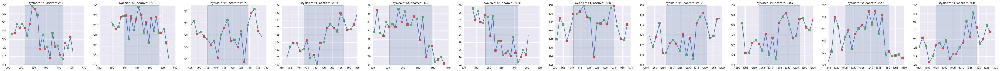

C:\Data\Antonio\software\src\voltagesensing\figures\Take1 Full Timetrace Patched_outphase QD 4 (94, 93).png

Patched_outphase QD 4 Number of bursts: 3


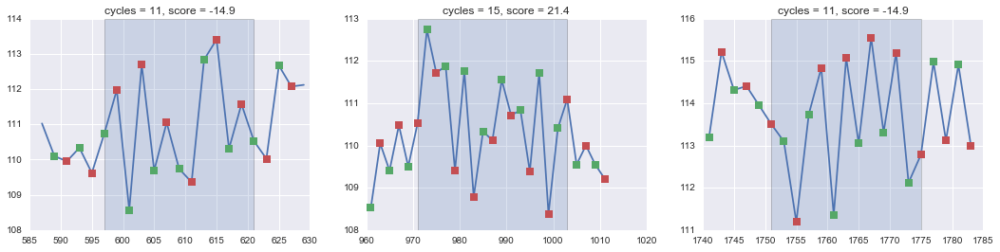

C:\Data\Antonio\software\src\voltagesensing\figures\Take1 Full Timetrace Patched_outphase QD 8 (161, 109).png

Patched_outphase QD 8 Number of bursts: 6


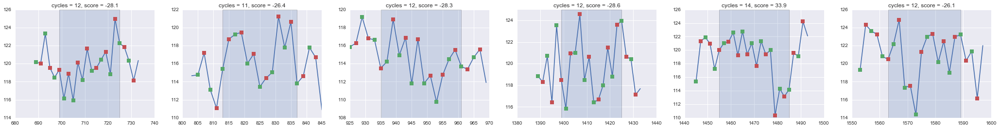

In [72]:
patched = True
inphase = False

label = 'Patched' if patched else 'Unpatched'
if inphase: label += '_inphase'
else: label += '_outphase'
points_sel = points_patched if patched else points_unpatched
ipoints = ipoints_patched if patched else ipoints_unpatched
offset = int(not inphase)

bursts_qd = []
for ipoint in ipoints:
    point = points_sel[ipoint]

    timetrace = tt.get_timetrace(data.video, point=point, clip_radius=clip_radius, detrend_sigma=detrend_sigma)
    timetracer = tt.get_timetrace(data.video, point=point, clip_radius=clip_radius, detrend_sigma=None, zero_mean=False)
    timetracem = tt.avg_nsamples(timetracer, 2, running_avg=False, offset=offset)
    t_timetrace = np.arange(timetrace.size)
    t_timetracem = np.arange(timetracem.size)*2 + offset
    t_ra = t_ravg(timetrace.size, inphase=inphase, num_samples=ncycles)
    t_da = t_diffall(timetrace.size, inphase=inphase)
    
    all_diff = tt.edge_diff_all(timetrace, offset=offset)
    rall_diff = tt.avg_nsamples(all_diff, num_samples=ncycles, running_avg=running_avg)

    signal = all_diff/np.abs(timetracer.mean())*1e2
    score2 = rall_diff/np.abs(timetracer.mean())*1e2
    
    if fraction is not None:
        bs_threshold = (score2**2).max()*fraction
    bursts, score = burstsearch_py(signal, m=ncycles, threshold=bs_threshold, debug=True)
    assert np.allclose(score, score2)
    assert bursts.shape[0] < 20
    bursts_qd.append(bursts)

    fig, ax = plt.subplots(figsize=(200, 4))
    ax.plot(t_timetracem, timetracem, 'k', alpha=0.2)
    ax.plot(t_timetracem[::2], timetracem[::2], 'sg')
    ax.plot(t_timetracem[1::2], timetracem[1::2], 'sr')
    ax.set_ylim(ax.get_ylim()[0]*0.95)
    ax2 = ax.twinx()
    ax2.grid(False)
    ax2.plot(t_ra, score**2)
    for b in bursts:
        ax.axvspan(t_da[b['start']], t_da[b['stop']], alpha=0.15)

    name = 'figures/%s Full Timetrace %s QD %d (%d, %d).png' % (dataset_label, label, ipoint, point[0], point[1])
    plt.savefig(name, bbox_inches='tight')
    plt.close(fig)
    display(FileLink(name))
    print('%s QD %d Number of bursts: %d' % (label, ipoint, bursts.shape[0]))
    
    if bursts.shape[0] > 0:
        itm_start = bursts.start
        itm_stop = bursts.stop + 1

        width_ms = 1e3*((bursts.stop + 1 - bursts.start)*2/400)
        v_on = slice(None, None, 2)
        v_off = slice(1, None, 2)
        fig, ax = plt.subplots(1, bursts.shape[0], figsize=(6*bursts.shape[0], 4), squeeze=False)
        for i in range(bursts.shape[0]):
            pstart = itm_start[i] - pad
            pstop = itm_stop[i] + pad
            pstart = np.clip(pstart, 0, t_timetracem.size - 1)
            pstop = np.clip(pstop, 0, t_timetracem.size - 1)

            tm_on_start = np.nonzero(t_timetracem[v_on] >= t_timetracem[pstart])[0][0]
            tm_on_stop = np.nonzero(t_timetracem[v_on] <= t_timetracem[pstop])[0][-1]
            tm_off_start = np.nonzero(t_timetracem[v_off] >= t_timetracem[pstart])[0][0]
            tm_off_stop = np.nonzero(t_timetracem[v_off] <= t_timetracem[pstop])[0][-1]

            ax[0,i].plot(t_timetracem[pstart:pstop], timetracem[pstart:pstop], '-')
            ax[0,i].plot(t_timetracem[v_on][tm_on_start:tm_on_stop], timetracem[v_on][tm_on_start:tm_on_stop], 's', ms=8)
            ax[0,i].plot(t_timetracem[v_off][tm_on_start:tm_on_stop], timetracem[v_off][tm_on_start:tm_on_stop], 's', ms=8)
            ax[0,i].axvspan(t_timetracem[itm_start[i]], t_timetracem[itm_stop[i]], alpha=0.2, linewidth=1)

            ax[0,i].set_title('cycles = %d, score = %.1f' % (bursts.stop[i] - bursts.start[i], bursts.score[i]))
        plt.close(fig)
        display(fig)
if patched and inphase:
    bursts_qd_patched = bursts_qd
elif patched and not inphase:
    bursts_qd_patchedo = bursts_qd
elif not patched and inphase:
    bursts_qd_unpatched = bursts_qd
elif not patched and not inphase:
    bursts_qd_unpatchedo = bursts_qd

## Unpatched in-phase

C:\Data\Antonio\software\src\voltagesensing\figures\Take1 Full Timetrace Unpatched_inphase QD 2 (220, 61).png

Unpatched_inphase QD 2 Number of bursts: 6


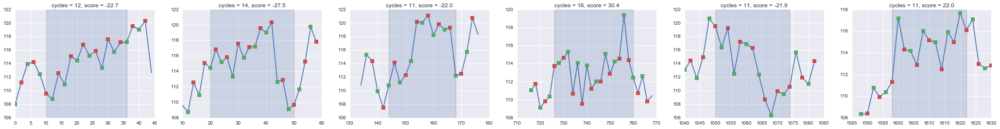

C:\Data\Antonio\software\src\voltagesensing\figures\Take1 Full Timetrace Unpatched_inphase QD 3 (212, 28).png

Unpatched_inphase QD 3 Number of bursts: 6


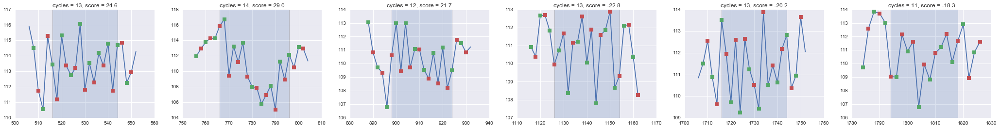

C:\Data\Antonio\software\src\voltagesensing\figures\Take1 Full Timetrace Unpatched_inphase QD 5 (249, 115).png

Unpatched_inphase QD 5 Number of bursts: 1


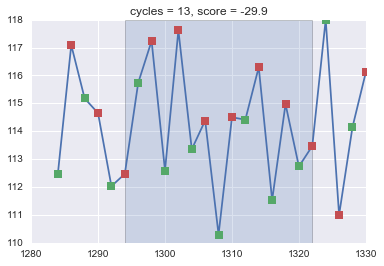

C:\Data\Antonio\software\src\voltagesensing\figures\Take1 Full Timetrace Unpatched_inphase QD 10 (227, 41).png

Unpatched_inphase QD 10 Number of bursts: 3


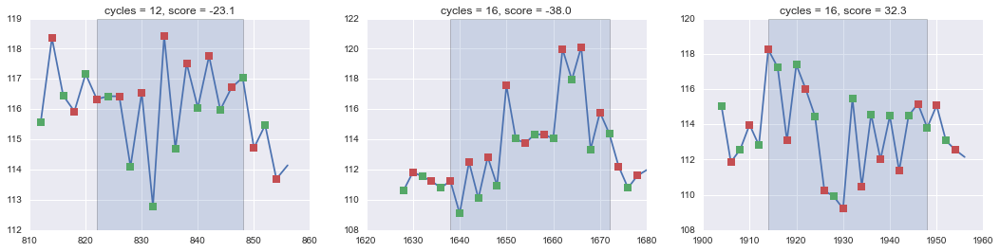

C:\Data\Antonio\software\src\voltagesensing\figures\Take1 Full Timetrace Unpatched_inphase QD 11 (226, 83).png

Unpatched_inphase QD 11 Number of bursts: 6


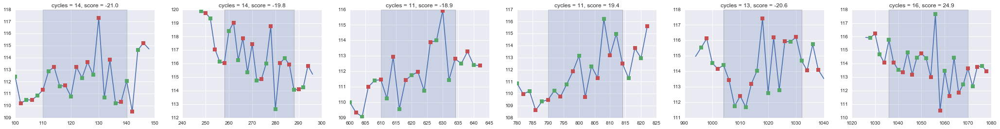

C:\Data\Antonio\software\src\voltagesensing\figures\Take1 Full Timetrace Unpatched_inphase QD 12 (195, 48).png

Unpatched_inphase QD 12 Number of bursts: 2


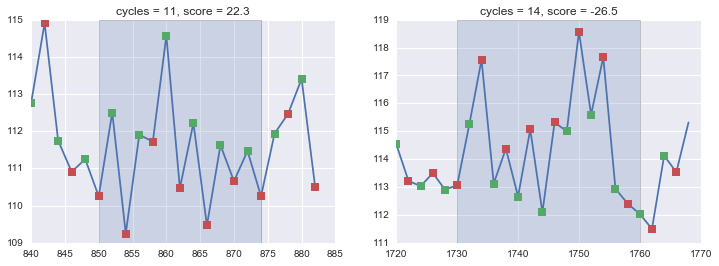

C:\Data\Antonio\software\src\voltagesensing\figures\Take1 Full Timetrace Unpatched_inphase QD 13 (247, 133).png

Unpatched_inphase QD 13 Number of bursts: 4


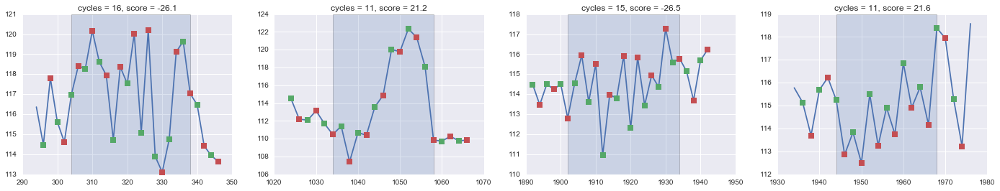

In [73]:
patched = False
inphase = True

label = 'Patched' if patched else 'Unpatched'
if inphase: label += '_inphase'
else: label += '_outphase'
points_sel = points_patched if patched else points_unpatched
ipoints = ipoints_patched if patched else ipoints_unpatched
offset = int(not inphase)

bursts_qd = []
for ipoint in ipoints:
    point = points_sel[ipoint]

    timetrace = tt.get_timetrace(data.video, point=point, clip_radius=clip_radius, detrend_sigma=detrend_sigma)
    timetracer = tt.get_timetrace(data.video, point=point, clip_radius=clip_radius, detrend_sigma=None, zero_mean=False)
    timetracem = tt.avg_nsamples(timetracer, 2, running_avg=False, offset=offset)
    t_timetrace = np.arange(timetrace.size)
    t_timetracem = np.arange(timetracem.size)*2 + offset
    t_ra = t_ravg(timetrace.size, inphase=inphase, num_samples=ncycles)
    t_da = t_diffall(timetrace.size, inphase=inphase)
    
    all_diff = tt.edge_diff_all(timetrace, offset=offset)
    rall_diff = tt.avg_nsamples(all_diff, num_samples=ncycles, running_avg=running_avg)

    signal = all_diff/np.abs(timetracer.mean())*1e2
    score2 = rall_diff/np.abs(timetracer.mean())*1e2
    
    if fraction is not None:
        bs_threshold = (score2**2).max()*fraction
    bursts, score = burstsearch_py(signal, m=ncycles, threshold=bs_threshold, debug=True)
    assert np.allclose(score, score2)
    assert bursts.shape[0] < 20
    bursts_qd.append(bursts)

    fig, ax = plt.subplots(figsize=(200, 4))
    ax.plot(t_timetracem, timetracem, 'k', alpha=0.2)
    ax.plot(t_timetracem[::2], timetracem[::2], 'sg')
    ax.plot(t_timetracem[1::2], timetracem[1::2], 'sr')
    ax.set_ylim(ax.get_ylim()[0]*0.95)
    ax2 = ax.twinx()
    ax2.grid(False)
    ax2.plot(t_ra, score**2)
    for b in bursts:
        ax.axvspan(t_da[b['start']], t_da[b['stop']], alpha=0.15)

    name = 'figures/%s Full Timetrace %s QD %d (%d, %d).png' % (dataset_label, label, ipoint, point[0], point[1])
    plt.savefig(name, bbox_inches='tight')
    plt.close(fig)
    display(FileLink(name))
    print('%s QD %d Number of bursts: %d' % (label, ipoint, bursts.shape[0]))
    
    if bursts.shape[0] > 0:
        itm_start = bursts.start
        itm_stop = bursts.stop + 1

        width_ms = 1e3*((bursts.stop + 1 - bursts.start)*2/400)
        v_on = slice(None, None, 2)
        v_off = slice(1, None, 2)
        fig, ax = plt.subplots(1, bursts.shape[0], figsize=(6*bursts.shape[0], 4), squeeze=False)
        for i in range(bursts.shape[0]):
            pstart = itm_start[i] - pad
            pstop = itm_stop[i] + pad
            pstart = np.clip(pstart, 0, t_timetracem.size - 1)
            pstop = np.clip(pstop, 0, t_timetracem.size - 1)

            tm_on_start = np.nonzero(t_timetracem[v_on] >= t_timetracem[pstart])[0][0]
            tm_on_stop = np.nonzero(t_timetracem[v_on] <= t_timetracem[pstop])[0][-1]
            tm_off_start = np.nonzero(t_timetracem[v_off] >= t_timetracem[pstart])[0][0]
            tm_off_stop = np.nonzero(t_timetracem[v_off] <= t_timetracem[pstop])[0][-1]

            ax[0,i].plot(t_timetracem[pstart:pstop], timetracem[pstart:pstop], '-')
            ax[0,i].plot(t_timetracem[v_on][tm_on_start:tm_on_stop], timetracem[v_on][tm_on_start:tm_on_stop], 's', ms=8)
            ax[0,i].plot(t_timetracem[v_off][tm_on_start:tm_on_stop], timetracem[v_off][tm_on_start:tm_on_stop], 's', ms=8)
            ax[0,i].axvspan(t_timetracem[itm_start[i]], t_timetracem[itm_stop[i]], alpha=0.2, linewidth=1)

            ax[0,i].set_title('cycles = %d, score = %.1f' % (bursts.stop[i] - bursts.start[i], bursts.score[i]))
        plt.close(fig)
        display(fig)
if patched and inphase:
    bursts_qd_patched = bursts_qd
elif patched and not inphase:
    bursts_qd_patchedo = bursts_qd
elif not patched and inphase:
    bursts_qd_unpatched = bursts_qd
elif not patched and not inphase:
    bursts_qd_unpatchedo = bursts_qd

## Unpatched out-phase

C:\Data\Antonio\software\src\voltagesensing\figures\Take1 Full Timetrace Unpatched_outphase QD 2 (220, 61).png

Unpatched_outphase QD 2 Number of bursts: 4


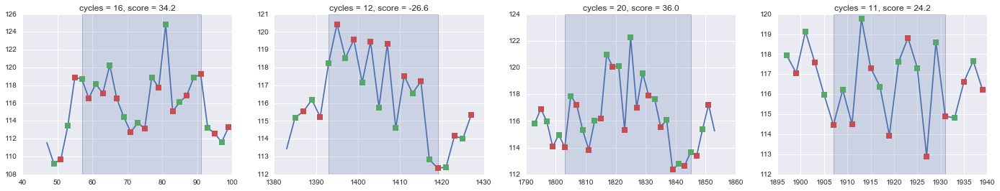

C:\Data\Antonio\software\src\voltagesensing\figures\Take1 Full Timetrace Unpatched_outphase QD 3 (212, 28).png

Unpatched_outphase QD 3 Number of bursts: 9


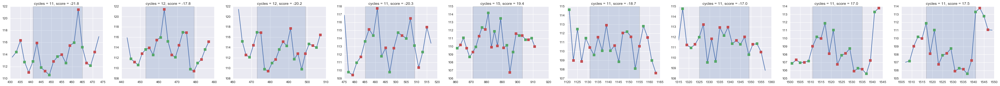

C:\Data\Antonio\software\src\voltagesensing\figures\Take1 Full Timetrace Unpatched_outphase QD 5 (249, 115).png

Unpatched_outphase QD 5 Number of bursts: 4


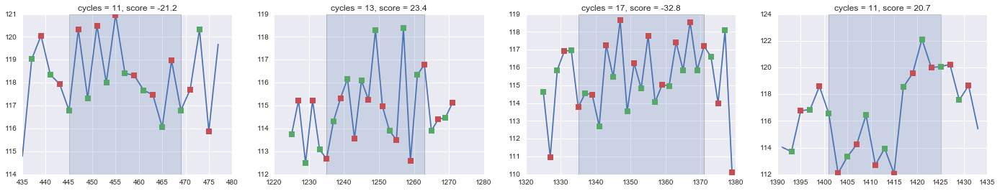

C:\Data\Antonio\software\src\voltagesensing\figures\Take1 Full Timetrace Unpatched_outphase QD 10 (227, 41).png

Unpatched_outphase QD 10 Number of bursts: 7


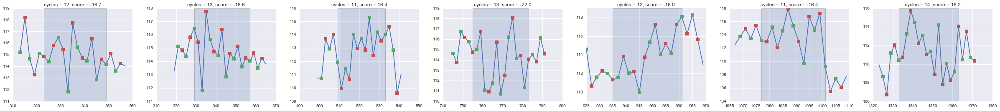

C:\Data\Antonio\software\src\voltagesensing\figures\Take1 Full Timetrace Unpatched_outphase QD 11 (226, 83).png

Unpatched_outphase QD 11 Number of bursts: 6


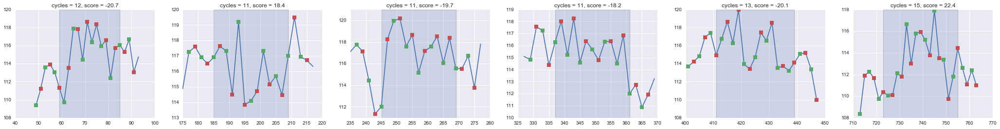

C:\Data\Antonio\software\src\voltagesensing\figures\Take1 Full Timetrace Unpatched_outphase QD 12 (195, 48).png

Unpatched_outphase QD 12 Number of bursts: 6


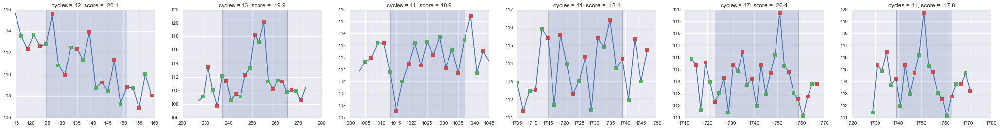

C:\Data\Antonio\software\src\voltagesensing\figures\Take1 Full Timetrace Unpatched_outphase QD 13 (247, 133).png

Unpatched_outphase QD 13 Number of bursts: 4


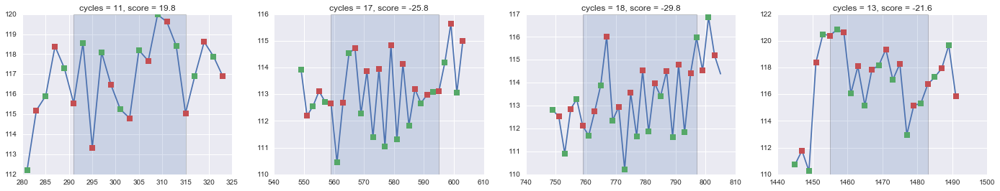

In [74]:
patched = False
inphase = False

label = 'Patched' if patched else 'Unpatched'
if inphase: label += '_inphase'
else: label += '_outphase'
points_sel = points_patched if patched else points_unpatched
ipoints = ipoints_patched if patched else ipoints_unpatched
offset = int(not inphase)

bursts_qd = []
for ipoint in ipoints:
    point = points_sel[ipoint]

    timetrace = tt.get_timetrace(data.video, point=point, clip_radius=clip_radius, detrend_sigma=detrend_sigma)
    timetracer = tt.get_timetrace(data.video, point=point, clip_radius=clip_radius, detrend_sigma=None, zero_mean=False)
    timetracem = tt.avg_nsamples(timetracer, 2, running_avg=False, offset=offset)
    t_timetrace = np.arange(timetrace.size)
    t_timetracem = np.arange(timetracem.size)*2 + offset
    t_ra = t_ravg(timetrace.size, inphase=inphase, num_samples=ncycles)
    t_da = t_diffall(timetrace.size, inphase=inphase)
    
    all_diff = tt.edge_diff_all(timetrace, offset=offset)
    rall_diff = tt.avg_nsamples(all_diff, num_samples=ncycles, running_avg=running_avg)

    signal = all_diff/np.abs(timetracer.mean())*1e2
    score2 = rall_diff/np.abs(timetracer.mean())*1e2
    
    if fraction is not None:
        bs_threshold = (score2**2).max()*fraction
    bursts, score = burstsearch_py(signal, m=ncycles, threshold=bs_threshold, debug=True)
    assert np.allclose(score, score2)
    assert bursts.shape[0] < 20
    bursts_qd.append(bursts)

    fig, ax = plt.subplots(figsize=(200, 4))
    ax.plot(t_timetracem, timetracem, 'k', alpha=0.2)
    ax.plot(t_timetracem[::2], timetracem[::2], 'sg')
    ax.plot(t_timetracem[1::2], timetracem[1::2], 'sr')
    ax.set_ylim(ax.get_ylim()[0]*0.95)
    ax2 = ax.twinx()
    ax2.grid(False)
    ax2.plot(t_ra, score**2)
    for b in bursts:
        ax.axvspan(t_da[b['start']], t_da[b['stop']], alpha=0.15)

    name = 'figures/%s Full Timetrace %s QD %d (%d, %d).png' % (dataset_label, label, ipoint, point[0], point[1])
    plt.savefig(name, bbox_inches='tight')
    plt.close(fig)
    display(FileLink(name))
    print('%s QD %d Number of bursts: %d' % (label, ipoint, bursts.shape[0]))
    
    if bursts.shape[0] > 0:
        itm_start = bursts.start
        itm_stop = bursts.stop + 1

        width_ms = 1e3*((bursts.stop + 1 - bursts.start)*2/400)
        v_on = slice(None, None, 2)
        v_off = slice(1, None, 2)
        fig, ax = plt.subplots(1, bursts.shape[0], figsize=(6*bursts.shape[0], 4), squeeze=False)
        for i in range(bursts.shape[0]):
            pstart = itm_start[i] - pad
            pstop = itm_stop[i] + pad
            pstart = np.clip(pstart, 0, t_timetracem.size - 1)
            pstop = np.clip(pstop, 0, t_timetracem.size - 1)

            tm_on_start = np.nonzero(t_timetracem[v_on] >= t_timetracem[pstart])[0][0]
            tm_on_stop = np.nonzero(t_timetracem[v_on] <= t_timetracem[pstop])[0][-1]
            tm_off_start = np.nonzero(t_timetracem[v_off] >= t_timetracem[pstart])[0][0]
            tm_off_stop = np.nonzero(t_timetracem[v_off] <= t_timetracem[pstop])[0][-1]

            ax[0,i].plot(t_timetracem[pstart:pstop], timetracem[pstart:pstop], '-')
            ax[0,i].plot(t_timetracem[v_on][tm_on_start:tm_on_stop], timetracem[v_on][tm_on_start:tm_on_stop], 's', ms=8)
            ax[0,i].plot(t_timetracem[v_off][tm_on_start:tm_on_stop], timetracem[v_off][tm_on_start:tm_on_stop], 's', ms=8)
            ax[0,i].axvspan(t_timetracem[itm_start[i]], t_timetracem[itm_stop[i]], alpha=0.2, linewidth=1)

            ax[0,i].set_title('cycles = %d, score = %.1f' % (bursts.stop[i] - bursts.start[i], bursts.score[i]))
        plt.close(fig)
        display(fig)
if patched and inphase:
    bursts_qd_patched = bursts_qd
elif patched and not inphase:
    bursts_qd_patchedo = bursts_qd
elif not patched and inphase:
    bursts_qd_unpatched = bursts_qd
elif not patched and not inphase:
    bursts_qd_unpatchedo = bursts_qd

## Aggregate scores and widths

In [75]:
scores_patched, widths_patched = [], []
for bursts in bursts_qd_patched:
    scores_patched.append(bursts.score)
    widths_patched.append(bursts.stop - bursts.start + 1)
scores_patchedc = np.concatenate(scores_patched)
widths_patchedc = np.concatenate(widths_patched)

scores_patchedc.size, scores_patched

(18, [array([-31.4840025 , -23.35195754,  26.61732978, -20.47929664,
         -26.1012352 , -22.36151534, -28.99817023, -24.78827895]),
  array([-21.0455666 , -15.86426559, -20.0376436 , -18.840098  , -14.10793566]),
  array([-31.91689849, -28.30764786, -33.7745963 , -27.28405261,  26.85307252])])

In [76]:
scores_unpatched, widths_unpatched = [], []
for bursts in bursts_qd_unpatched:
    scores_unpatched.append(bursts.score)
    widths_unpatched.append(bursts.stop - bursts.start + 1)
scores_unpatchedc = np.concatenate(scores_unpatched)
widths_unpatchedc = np.concatenate(widths_unpatched)

scores_unpatchedc.size, scores_unpatched

(28, [array([-22.7308806 , -27.52781395, -22.01517395,  30.44369778,
         -21.90529322,  22.0154363 ]),
  array([ 24.58348677,  29.01615424,  21.71025967, -22.81555034,
         -20.19934462, -18.26664648]),
  array([-29.85048705]),
  array([-23.08810052, -38.0245286 ,  32.34019956]),
  array([-21.00398693, -19.80064709, -18.85505608,  19.38571407,
         -20.58690879,  24.8808953 ]),
  array([ 22.31085778, -26.47331962]),
  array([-26.11340705,  21.23052163, -26.47731201,  21.59670495])])

In [77]:
scores_patchedo, widths_patchedo = [], []
for bursts in bursts_qd_patchedo:
    scores_patchedo.append(bursts.score)
    widths_patchedo.append(bursts.stop - bursts.start + 1)
scores_patchedco = np.concatenate(scores_patchedo)
widths_patchedco = np.concatenate(widths_patchedo)

scores_patchedco.size, scores_patchedo

(20, [array([ 21.63631273, -26.39833742,  21.51995807, -20.50415503,
          26.5711376 ,  20.77120453,  20.62781539, -21.24749264,
         -20.67767806, -22.67891291,  21.46987852]),
  array([-14.87949982,  21.40934576, -14.94373079]),
  array([-28.06783478, -26.44914992, -28.28407009, -28.60637106,
          33.88225557, -26.1232091 ])])

In [78]:
scores_unpatchedo, widths_unpatchedo = [], []
for bursts in bursts_qd_unpatchedo:
    scores_unpatchedo.append(bursts.score)
    widths_unpatchedo.append(bursts.stop - bursts.start + 1)
scores_unpatchedco = np.concatenate(scores_unpatchedo)
widths_unpatchedco = np.concatenate(widths_unpatchedo)

scores_unpatchedco.size, scores_unpatchedo

(40,
 [array([ 34.16363003, -26.63850493,  35.98195925,  24.2471258 ]),
  array([-21.80192873, -17.81688424, -20.24480948, -20.31701032,
          19.39786028, -18.6908385 , -17.01750453,  17.04112739,  17.51220101]),
  array([-21.18428112,  23.41418624, -32.81525797,  20.70275495]),
  array([-16.72364728, -18.5981818 ,  16.38192208, -22.0396035 ,
         -15.97263563, -16.360827  ,  16.19356714]),
  array([-20.72547631,  18.35243938, -19.74875707, -18.24040122,
         -20.08420725,  22.40253467]),
  array([-20.10110918, -19.93448348,  18.87184804, -18.14512726,
         -26.36491526, -17.80957776]),
  array([ 19.81510824, -25.76931372, -29.79616273, -21.64530162])])

## Violin plots

C:\Users\laser2002j\Miniconda3\envs\voltagesensing_env_py3\lib\site-packages\matplotlib\__init__.py:892: UserWarning: axes.color_cycle is deprecated and replaced with axes.prop_cycle; please use the latter.
  warnings.warn(self.msg_depr % (key, alt_key))


(array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9]), <a list of 10 Text xticklabel objects>)

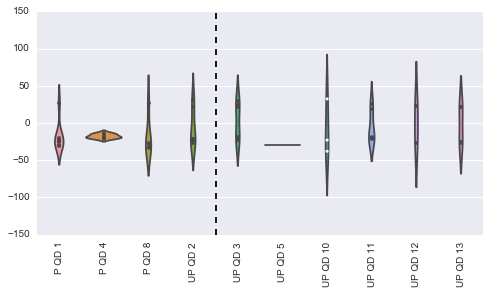

In [79]:
fig, ax = plt.subplots(figsize=(8, 4))

names_p = ['P QD %d' % i for i in ipoints_patched]
names_u = ['UP QD %d' % i for i in ipoints_unpatched]
ax = sns.violinplot(data=scores_patched + scores_unpatched, inner='points')
ax.set(xticklabels=names_p + names_u)
plt.axvline(len(ipoints_patched) + 0.5, ls='--', color='k')
plt.xticks(rotation=90)
#ax.set_xlim(-0.5);

C:\Users\laser2002j\Miniconda3\envs\voltagesensing_env_py3\lib\site-packages\matplotlib\__init__.py:892: UserWarning: axes.color_cycle is deprecated and replaced with axes.prop_cycle; please use the latter.
  warnings.warn(self.msg_depr % (key, alt_key))


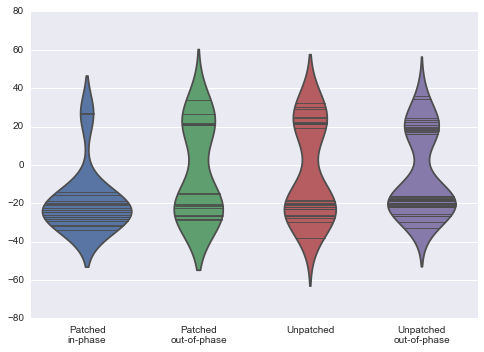

In [80]:
ax = sns.violinplot(data=[scores_patchedc, scores_patchedco, scores_unpatchedc, scores_unpatchedco], inner='stick');
ax.set(xticklabels=['Patched\nin-phase', 'Patched\nout-of-phase', 'Unpatched', 'Unpatched\nout-of-phase'])
patch_violin_plot()

C:\Users\laser2002j\Miniconda3\envs\voltagesensing_env_py3\lib\site-packages\matplotlib\__init__.py:892: UserWarning: axes.color_cycle is deprecated and replaced with axes.prop_cycle; please use the latter.
  warnings.warn(self.msg_depr % (key, alt_key))


[[<matplotlib.text.Text at 0x1d10c390>,

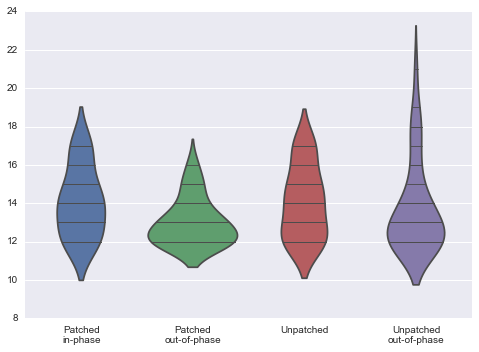

In [81]:
ax = sns.violinplot(data=[widths_patchedc, widths_patchedco, widths_unpatchedc, widths_unpatchedco], inner='stick');
ax.set(xticklabels=['Patched\nin-phase', 'Patched\nout-of-phase', 'Unpatched', 'Unpatched\nout-of-phase'])

## Paper figures

In [82]:
blue = '#87aade'# '#5f8dd3'
gray1 = '#b7b7c8'
green1 = '#c6e9af'
green = '#2ca02c'
red = '#E41A1C' #"#e74c3c" #
purple = "#9b59b6"

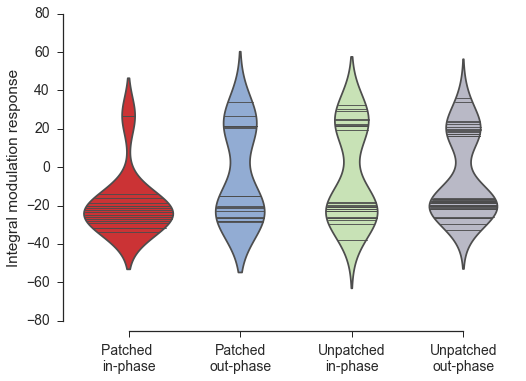

In [83]:
sns.set_context('notebook', font_scale=1.4)
sns.set_style('ticks')

ax = sns.violinplot(data=[scores_patchedc, scores_patchedco, scores_unpatchedc, scores_unpatchedco], 
                    inner='stick', palette=[red, blue, green1, gray1]);
ax.set(xticklabels=['Patched \nin-phase', 'Patched\nout-phase', 'Unpatched\nin-phase', 'Unpatched\nout-phase'])
sns.despine(offset=10, trim=True)
plt.ylabel('Integral modulation response');
patch_violin_plot()

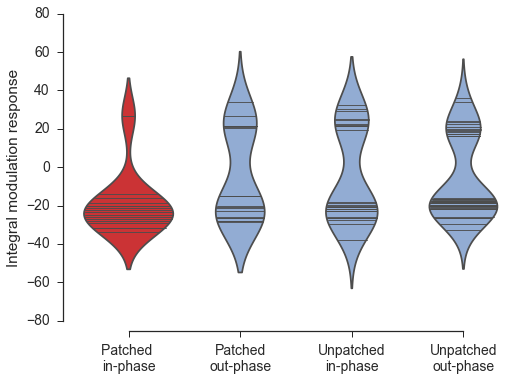

In [84]:
sns.set_context('notebook', font_scale=1.4)
sns.set_style('ticks')

ax = sns.violinplot(data=[scores_patchedc, scores_patchedco, scores_unpatchedc, scores_unpatchedco], 
                    inner='stick', palette=[red, blue, blue, blue]);
ax.set(xticklabels=['Patched \nin-phase', 'Patched\nout-phase', 'Unpatched\nin-phase', 'Unpatched\nout-phase'])
sns.despine(offset=10, trim=True)
plt.ylabel('Integral modulation response');
patch_violin_plot()

In [85]:
def plot_single_burst(ax,
        ipoint = 1,                        # Index of QD in the full list
        points_list = points_patched,      # Full list of QDs
        ipoints_bursts = ipoints_patched,  # List of QD index used in burst search
        bursts_list = bursts_qd_patched,   # List of bursts arrays (one per QD)
        iburst = 6,                        # Burst number to be plotted   
        spancolor = colors[0],
        pad = 5,
        clip_radius = 1.8):
    
    ipoint_bursts = ipoints_bursts.index(ipoint)  # index of QD "ipoint" in ipoints_patched
    bursts = bursts_list[ipoint_bursts]
    point = points_list[ipoint]
    
    timetracer = tt.get_timetrace(data.video, point=point, clip_radius=clip_radius, detrend_sigma=None, zero_mean=False)
    timetracem = tt.avg_nsamples(timetracer, 2, running_avg=False)
    voltagem = tt.avg_nsamples(data.voltage, 2, running_avg=False)
    t_timetracem = np.arange(timetracem.size)*2
    if bursts.shape[0] > 0:
        itm_start = bursts.start
        itm_stop = bursts.stop + 1

        #width_ms = 1e3*((bursts.stop + 1 - bursts.start)*2/400)
        v_on = slice(None, None, 2)
        v_off = slice(1, None, 2)

        #fig, ax = plt.subplots(1, 1, figsize=(6, 4))
        pstart = itm_start[iburst] - pad
        pstop = itm_stop[iburst] + pad

        tm_on_start = np.nonzero(t_timetracem[v_on] >= t_timetracem[pstart])[0][0]
        tm_on_stop = np.nonzero(t_timetracem[v_on] <= t_timetracem[pstop])[0][-1]
        tm_off_start = np.nonzero(t_timetracem[v_off] >= t_timetracem[pstart])[0][0]
        tm_off_stop = np.nonzero(t_timetracem[v_off] <= t_timetracem[pstop])[0][-1]

        t_scale = 2.5e-3
        ax.plot(t_timetracem[pstart:pstop]*t_scale, timetracem[pstart:pstop], '-')
        ax.plot(t_timetracem[v_on][tm_on_start:tm_on_stop]*t_scale, timetracem[v_on][tm_on_start:tm_on_stop], 's', ms=8)
        ax.plot(t_timetracem[v_off][tm_off_start:tm_off_stop]*t_scale, timetracem[v_off][tm_off_start:tm_off_stop], 'h', ms=9)
        ax.axvspan(t_timetracem[itm_start[iburst]]*t_scale, t_timetracem[itm_stop[iburst]]*t_scale, alpha=0.2, linewidth=1, color=spancolor)

        ax2 = ax.twinx()
        ax2.plot(t_timetracem[pstart:pstop]*t_scale, -voltagem[pstart:pstop], '-k', drawstyle='steps-mid')
        ax2.set_ylim(0,20)
        ax2.axis('off')
        ax2.text(4.644, 0.6, 'V', fontsize=18)
        #ax.set_title('cycles = %d, score = %.1f' % (bursts.stop[i] - bursts.start[i] + 1, bursts.score[i]))
        #sns.despine(fig, offset=10, trim=True)
        ax.set_xlabel('Time (s)')
        ax.set_ylim(125)

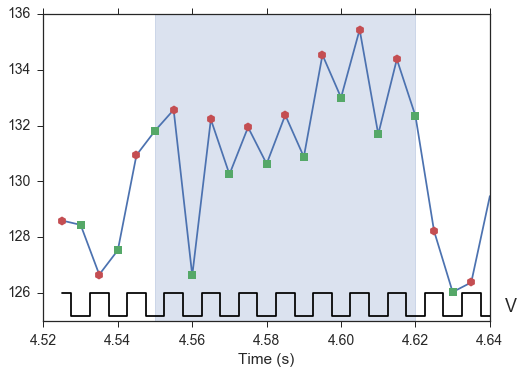

In [86]:
plot_single_burst(plt.gca())

In [87]:
def plot_bursts_span(ax,
        bursts = bursts_qd_patched[ipoints_patched.index(1)],
        iburst = None,
        spancolor=colors[0]):

    t_timetracem = np.arange(timetracem.size)*2   # NOTE: timetracem from global scope
    t_scale = 2.5e-3
    if bursts.shape[0] > 0:
        itm_start = bursts.start
        itm_stop = bursts.stop + 1

        if iburst is None:
            burst_range = range(bursts.shape[0])
        else:
            burst_range = [iburst]
        for i in burst_range:
            ax.axvspan(t_timetracem[itm_start[i]]*t_scale, t_timetracem[itm_stop[i]]*t_scale, alpha=0.2, linewidth=1, color=spancolor)

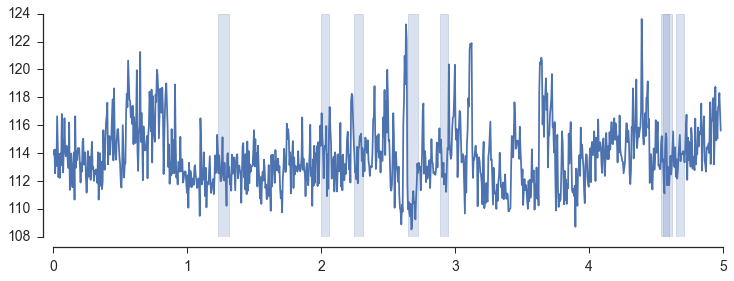

In [88]:
fig, ax = plt.subplots(figsize=(12, 4))

t_scale = 2.5e-3
ax.plot(t_timetracem*t_scale, timetracem)
#ax.axvspan(t_timetracem[itm_start[i]]*t_scale, t_timetracem[itm_stop[i]]*t_scale, alpha=0.2, linewidth=1, color=colors[2])
sns.despine(fig, offset=10)

plot_bursts_span(ax)

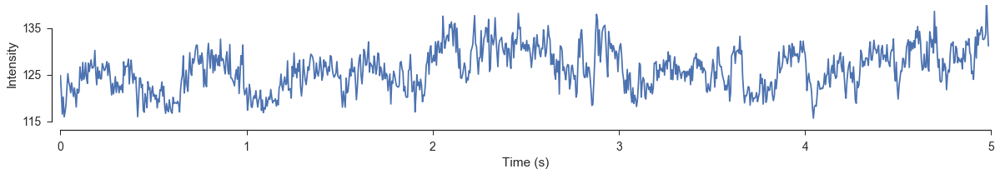

In [89]:
timetracer = tt.get_timetrace(data.video, point=points_patched[1], clip_radius=clip_radius, detrend_sigma=None, zero_mean=False)
t_timetracer = np.arange(timetracer.size)*2.5e-3
timetracem = tt.avg_nsamples(timetracer, 2, running_avg=False, offset=0)
t_timetracem = (np.arange(timetracem.size)*2)*2.5e-3

fig, ax = plt.subplots(figsize=(20, 2.5))
ax.plot(t_timetracem, timetracem)
ax.set_xlabel('Time (s)')
ax.set_ylabel('Intensity')
plt.yticks([115, 125, 135])
ax.set_ylim(115, 140)
sns.despine(fig, offset=10, trim=True)
plt.savefig('paper_figures/single-timetrace-2frames_mean.png', dpi=180, bbox_inches='tight')

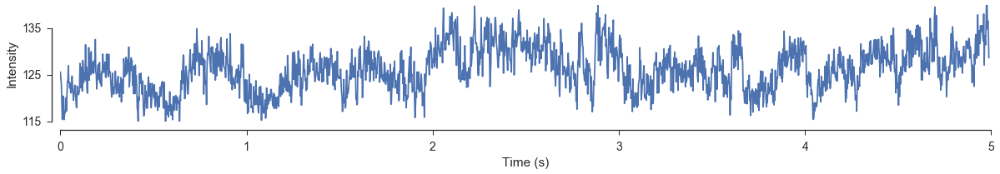

In [90]:
timetracer = tt.get_timetrace(data.video, point=points_patched[1], clip_radius=clip_radius, detrend_sigma=None, zero_mean=False)
t_timetracer = np.arange(timetracer.size)*2.5e-3
timetracem = tt.avg_nsamples(timetracer, 2, running_avg=False, offset=0)
t_timetracem = (np.arange(timetracem.size)*2)*2.5e-3

fig, ax = plt.subplots(figsize=(20, 2.5))
ax.plot(t_timetracer, timetracer)
ax.set_xlabel('Time (s)')
ax.set_ylabel('Intensity')
plt.yticks([115, 125, 135])
ax.set_ylim(115, 140)
sns.despine(fig, offset=10, trim=True)
plt.savefig('paper_figures/single-timetrace.png', dpi=180, bbox_inches='tight')

In [91]:
import matplotlib.gridspec as gridspec

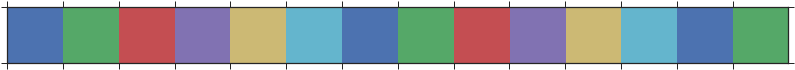

In [92]:
sns.palplot(colors)

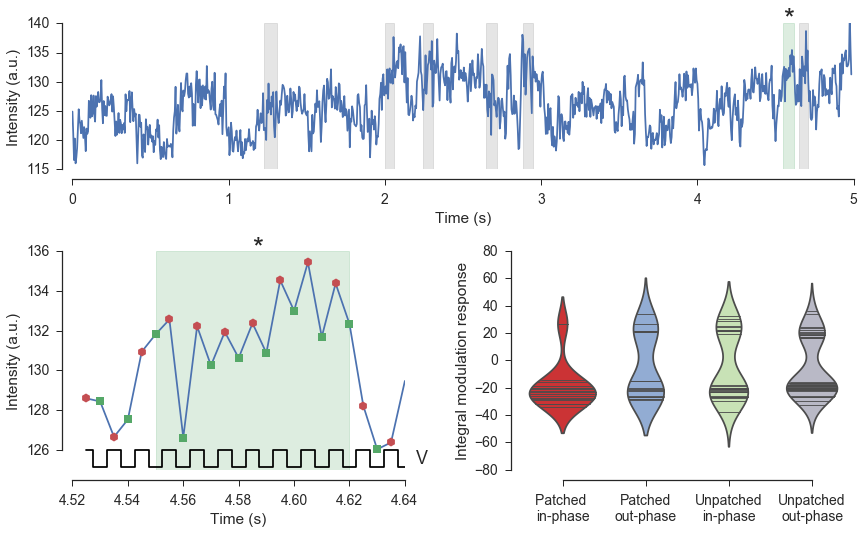

In [93]:
fig = plt.figure(figsize=(14, 8))

gs = gridspec.GridSpec(2, 2, height_ratios=[1, 1.5])
gs.update(wspace=0.35, hspace=0.45)
ax1 = fig.add_subplot(gs[0, :])
ax2 = fig.add_subplot(gs[1, 0])
ax3 = fig.add_subplot(gs[1, 1])

ax1.plot(t_timetracem, timetracem)
ax1.set_xlabel('Time (s)')
ax1.set_ylabel('Intensity (a.u.)')
ax1.text(4.55, 139.5, '*', fontsize=28)
for iburst in [0, 1, 2, 3, 4, 7]:
    plot_bursts_span(ax1, iburst=iburst, spancolor='gray')
plot_bursts_span(ax1, iburst=6, spancolor=colors[1])
ax1.set_ylim(115, 140)

plot_single_burst(ax2, spancolor=colors[1])
ax2.set_ylabel('Intensity (a.u.)')
ax2.text(4.585, 135.8, '*', fontsize=28)


sns.violinplot(data=[scores_patchedc, scores_patchedco, scores_unpatchedc, scores_unpatchedco], 
               inner='stick', palette=[red, blue, green1, gray1], ax=ax3);
ax3.set(xticklabels=['Patched \nin-phase', 'Patched\nout-phase', 'Unpatched\nin-phase', 'Unpatched\nout-phase'])
ax3.set_ylabel('Integral modulation response');


sns.despine(fig=fig, ax=[ax1], offset=10, trim=True)
plt.savefig('paper_figures/multi-plot.png', dpi=180, bbox_inches='tight')

# 8. Signal Histograms

In this section we plot the distribution of the signal for the patched and unpatched QDs. In the following series of plots, the 3 columns represent the distribution of the signal averaged over a different number of modulation semi-periods (2, 8 and 16-cycles corresponding to 1, 4 and 8 periods). Each row of 3 plots represents a different QD. Mean of the distributions are showed as vertical lines (solid for in-phase, dashed for out-of-phase).

In [94]:
sns.set_style('ticks')
sns.set_context('notebook', font_scale=1.2)
multi_ncycles = [2, 8, 18]
running_avg = True
clip_radius = 1.8
detrend_sigma = 300
normalize_intensity = True
hist_style = dict(
        lw = 1.6,
        alpha = 0.6,
        histtype = 'stepfilled')

In [95]:
patched = True

points_sel = points_patched if patched else points_unpatched
ipoints = ipoints_patched if patched else ipoints_unpatched

n_alt_diff, n_alt_diffo = {n: [] for n in multi_ncycles}, {n: [] for n in multi_ncycles}
for ncycles in multi_ncycles:
    for ip, point in enumerate(points_sel):
        timetrace = tt.get_timetrace(data.video, point=point, clip_radius=clip_radius, detrend_sigma=detrend_sigma)
        #timetrace_on = timetrace
        time_on, timetrace_on = tt.get_on_periods_timetrace(timetrace, thresholds[ip], lowpass_sigma=10, align=4)

        alt_diff = tt.edge_diff_all(timetrace_on, offset=0) 
        alt_diffo = tt.edge_diff_all(timetrace_on, offset=1)        
        n_alt_diff[ncycles].append(
            tt.avg_nsamples(alt_diff, num_samples=ncycles, running_avg=running_avg))
        n_alt_diffo[ncycles].append(
            tt.avg_nsamples(alt_diffo, num_samples=ncycles, running_avg=running_avg))

nbins = 25
name = '%d-cycles avg of alt. diff.' % ncycles
fig, ax = plt.subplots(len(ipoints), len(multi_ncycles), 
                       figsize=(4*len(multi_ncycles), 3*len(ipoints)))
fig.tight_layout()
for ip, ipoint in enumerate(ipoints):
    point = points_sel[ipoint]
        
    if normalize_intensity:
        timetracer = tt.get_timetrace(data.video, point=point, clip_radius=clip_radius, detrend_sigma=None, zero_mean=False)
        norm = 1e2/np.abs(timetracer.mean())
    else:
        norm = 1.
    
    for cidx, ncycles in enumerate(multi_ncycles):
        sample, sampleo = n_alt_diff[ncycles][ip], n_alt_diffo[ncycles][ip]
        
        bin_abs_max = np.max([np.abs(sample).max(), np.abs(sampleo).max()])
        bins = np.linspace(-bin_abs_max*1.1, bin_abs_max*1.1, nbins+1)
        centers = bins[:-1] + 0.5*(bins[1] - bins[0])

        ax[ip, cidx].hist(n_alt_diff[ncycles][ip]*norm, bins=bins, label='QD %d in-phase' % ip, color=colors[1], edgecolor=colors[1], **hist_style)
        ax[ip, cidx].hist(n_alt_diffo[ncycles][ip]*norm, bins=bins, label='QD %d out-of-phase' % ip, color='gray', edgecolor='gray', zorder=-1, **hist_style)
        ax[ip, cidx].axvline((n_alt_diff[ncycles][ip]*norm).mean(), color='k', alpha=0.9)
        ax[ip, cidx].axvline((n_alt_diffo[ncycles][ip]*norm).mean(), color='k', ls='--', alpha=0.9)
        
        ax[0, cidx].set_title('Patched: %d-cycles average' % ncycles)
    ax[ip, 0].legend(loc='upper left')
sns.despine(fig)
plt.close(fig)
if patched:
    fig_patched = fig
else:
    fig_unpatched = fig

In [96]:
patched = False

points_sel = points_patched if patched else points_unpatched
ipoints = ipoints_patched if patched else ipoints_unpatched

n_alt_diff, n_alt_diffo = {n: [] for n in multi_ncycles}, {n: [] for n in multi_ncycles}
for ncycles in multi_ncycles:
    for ip, point in enumerate(points_sel):
        timetrace = tt.get_timetrace(data.video, point=point, clip_radius=clip_radius, detrend_sigma=detrend_sigma)
        #timetrace_on = timetrace
        time_on, timetrace_on = tt.get_on_periods_timetrace(timetrace, thresholds[ip], lowpass_sigma=10, align=4)

        alt_diff = tt.edge_diff_all(timetrace_on, offset=0) 
        alt_diffo = tt.edge_diff_all(timetrace_on, offset=1)        
        n_alt_diff[ncycles].append(
            tt.avg_nsamples(alt_diff, num_samples=ncycles, running_avg=running_avg))
        n_alt_diffo[ncycles].append(
            tt.avg_nsamples(alt_diffo, num_samples=ncycles, running_avg=running_avg))

nbins = 25
name = '%d-cycles avg of alt. diff.' % ncycles
fig, ax = plt.subplots(len(ipoints), len(multi_ncycles), 
                       figsize=(4*len(multi_ncycles), 3*len(ipoints)))
fig.tight_layout()
for ip, ipoint in enumerate(ipoints):
    point = points_sel[ipoint]
        
    if normalize_intensity:
        timetracer = tt.get_timetrace(data.video, point=point, clip_radius=clip_radius, detrend_sigma=None, zero_mean=False)
        norm = 1e2/np.abs(timetracer.mean())
    else:
        norm = 1.
    
    for cidx, ncycles in enumerate(multi_ncycles):
        sample, sampleo = n_alt_diff[ncycles][ip], n_alt_diffo[ncycles][ip]
        
        bin_abs_max = np.max([np.abs(sample).max(), np.abs(sampleo).max()])
        bins = np.linspace(-bin_abs_max*1.1, bin_abs_max*1.1, nbins+1)
        centers = bins[:-1] + 0.5*(bins[1] - bins[0])

        ax[ip, cidx].hist(n_alt_diff[ncycles][ip]*norm, bins=bins, label='QD %d in-phase' % ip, color=colors[1], edgecolor=colors[1], **hist_style)
        ax[ip, cidx].hist(n_alt_diffo[ncycles][ip]*norm, bins=bins, label='QD %d out-of-phase' % ip, color='gray', edgecolor='gray', zorder=-1, **hist_style)
        ax[ip, cidx].axvline((n_alt_diff[ncycles][ip]*norm).mean(), color='k', alpha=0.9)
        ax[ip, cidx].axvline((n_alt_diffo[ncycles][ip]*norm).mean(), color='k', ls='--', alpha=0.9)
        
        ax[0, cidx].set_title('Patched: %d-cycles average' % ncycles)
    ax[ip, 0].legend(loc='upper left')
plt.close(fig)
if patched:
    fig_patched = fig
else:
    fig_unpatched = fig

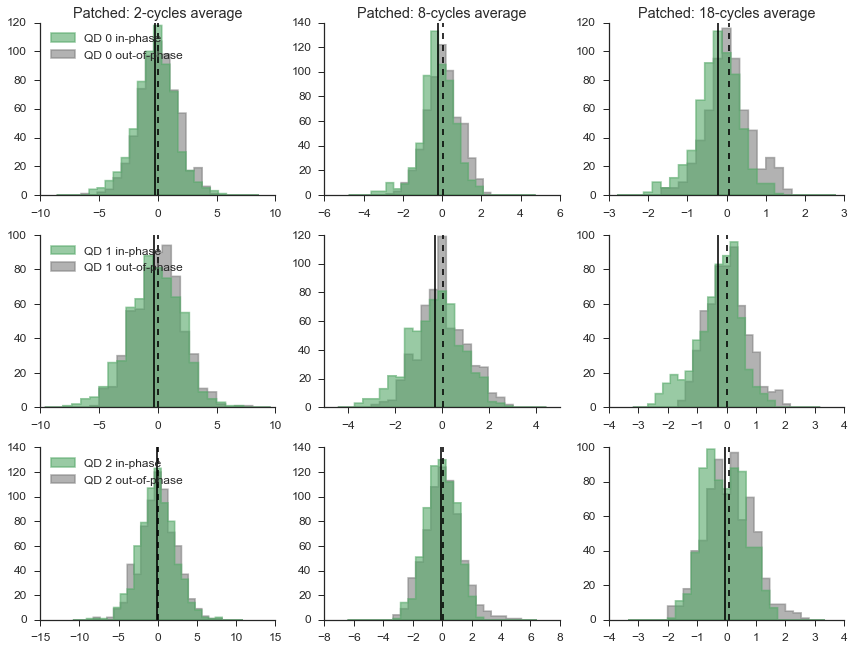

In [97]:
fig_patched

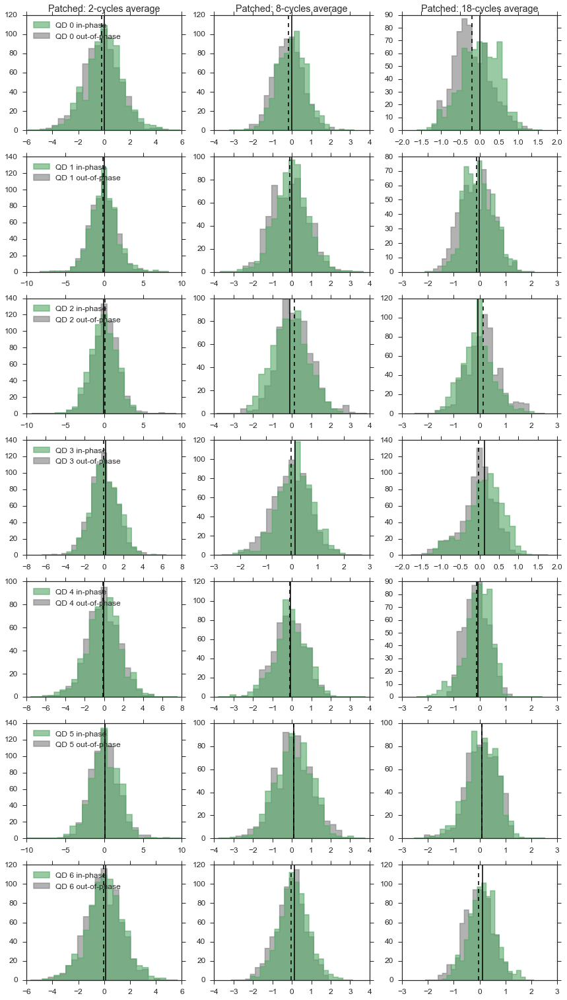

In [98]:
fig_unpatched

# 9. All QD Means

In [99]:
ipoints_patched

[1, 4, 8]

In [100]:
points_sel = [points_patched[i] for i in ipoints_patched]
multi_ncycles = [8, 12, 18, 36]
running_avg = False
clip_radius = 1.8
detrend_sigma = 300

rall_diff_n, rall_diff_no = {n: [] for n in multi_ncycles}, {n: [] for n in multi_ncycles}

for ncycles in multi_ncycles:
    for ip, point in enumerate(points_sel):
        
        timetrace = tt.get_timetrace(data.video, point=point, clip_radius=clip_radius, detrend_sigma=detrend_sigma)
        #timetrace_on = timetrace
        time_on, timetrace_on = tt.get_on_periods_timetrace(timetrace, thresholds[ip], lowpass_sigma=10, align=4)

        all_diff = tt.edge_diff_all(timetrace_on, offset=0)
        rall_diff_n[ncycles].append(
            tt.avg_nsamples(all_diff, num_samples=ncycles, running_avg=running_avg))
        
        all_diffo = tt.edge_diff_all(timetrace_on, offset=1)        
        rall_diff_no[ncycles].append(
            tt.avg_nsamples(all_diffo, num_samples=ncycles, running_avg=running_avg))

signal_cycle = np.zeros((len(points_sel), len(multi_ncycles)))
signal_cycleo = np.zeros((len(points_sel), len(multi_ncycles)))
sigma_cycle = np.zeros((len(points_sel), len(multi_ncycles)))
sigma_cycleo = np.zeros((len(points_sel), len(multi_ncycles)))
for ip, point in enumerate(points_sel):
    timetracer = tt.get_timetrace(data.video, point=point, clip_radius=clip_radius, detrend_sigma=None, zero_mean=False)
    
    signal = [rall_diff_n[nc][ip]/np.abs(timetracer.mean())*1e2 for nc in multi_ncycles]
    signal_cycle[ip] = [s.mean() for s in signal]
    sigma_cycle[ip] = [s.std()/np.sqrt(s.size) for s in signal]
    
    signal = [rall_diff_no[nc][ip]/np.abs(timetracer.mean())*1e2 for nc in multi_ncycles]
    signal_cycleo[ip] = [s.mean() for s in signal]
    sigma_cycleo[ip] = [s.std()/np.sqrt(s.size) for s in signal]

In [101]:
points_sel = points_unpatched

rall_diff_n, rall_diff_no = {n: [] for n in multi_ncycles}, {n: [] for n in multi_ncycles}

for ncycles in multi_ncycles:
    for ip, point in enumerate(points_sel):
        
        timetrace = tt.get_timetrace(data.video, point=point, clip_radius=clip_radius, detrend_sigma=detrend_sigma)
        #timetrace_on = timetrace
        time_on, timetrace_on = tt.get_on_periods_timetrace(timetrace, thresholds[ip], lowpass_sigma=10, align=4)

        all_diff = tt.edge_diff_all(timetrace_on, offset=0)
        rall_diff_n[ncycles].append(
            tt.avg_nsamples(all_diff, num_samples=ncycles, running_avg=running_avg))
        
        all_diffo = tt.edge_diff_all(timetrace_on, offset=1)        
        rall_diff_no[ncycles].append(
            tt.avg_nsamples(all_diffo, num_samples=ncycles, running_avg=running_avg))

signal_cycleu = np.zeros((len(points_sel), len(multi_ncycles)))
signal_cycleuo = np.zeros((len(points_sel), len(multi_ncycles)))
sigma_cycleu = np.zeros((len(points_sel), len(multi_ncycles)))
sigma_cycleuo = np.zeros((len(points_sel), len(multi_ncycles)))
for ip, point in enumerate(points_sel):
    timetracer = tt.get_timetrace(data.video, point=point, clip_radius=clip_radius, detrend_sigma=None, zero_mean=False)
    
    signal = [rall_diff_n[nc][ip]/np.abs(timetracer.mean())*1e2 for nc in multi_ncycles]
    signal_cycleu[ip] = [s.mean() for s in signal]
    sigma_cycleu[ip] = [s.std()/np.sqrt(s.size) for s in signal]
    
    signal = [rall_diff_no[nc][ip]/np.abs(timetracer.mean())*1e2 for nc in multi_ncycles]
    signal_cycleuo[ip] = [s.mean() for s in signal]
    sigma_cycleuo[ip] = [s.std()/np.sqrt(s.size) for s in signal]

C:\Users\laser2002j\Miniconda3\envs\voltagesensing_env_py3\lib\site-packages\matplotlib\axes\_axes.py:519: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


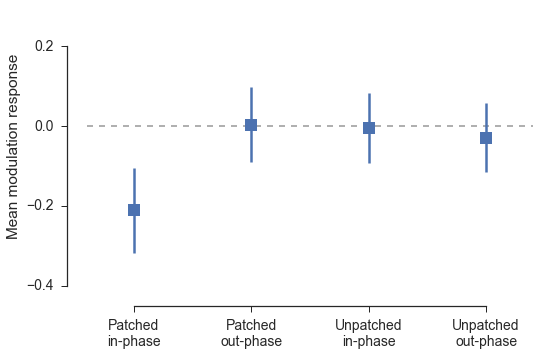

In [102]:
sns.set_context('notebook', font_scale=1.4)
sns.set_style('ticks')
alpha=1
fig, ax = plt.subplots(figsize=(8, 5))

icycle = 1
y = np.array([s.mean(axis=0)[icycle] for s in (signal_cycle, signal_cycleo, signal_cycleu, signal_cycleuo)])
yerr =  np.array([s.mean(axis=0)[icycle] for s in (sigma_cycle, sigma_cycleo, sigma_cycleu, sigma_cycleuo)])
x = np.arange(len(y))
ax.errorbar(x=x, y=y, yerr=yerr, ls='', marker='s', ms=12, lw=2.5,)#capsize=8, capthick=1.6)
ax.axhline(0, color='gray', zorder=-1, alpha=0.7, ls='--')
ax.legend(loc='upper left', ncol=2)

#ax.set_title('QDs average signal (%d cycles avg.)' % multi_ncycles[icycle])
ax.set_ylabel('Mean modulation response')
ax.set_ylim(-0.4, 0.3)
ax.set_xlim(-0.4, 3.4)
plt.xticks([0, 1, 2, 3], ['Patched\nin-phase', 'Patched\nout-phase', 'Unpatched\nin-phase', 'Unpatched\nout-phase'])
ax.locator_params(axis='y', tight=True, nbins=4)
sns.despine(offset=20, trim=True);
plt.savefig('paper_figures/aggregated-mean-signal.png', dpi=180, bbox_inches='tight')

In [103]:
points_sel = [points_patched[i] for i in ipoints_patched]
ncycles = 18
running_avg = True
clip_radius = 1.8
detrend_sigma = 300

rall_diff, rall_diffo = [], []
signal_tot, signal_toto = [], []
for ip, point in enumerate(points_sel):
    timetracer = tt.get_timetrace(data.video, point=point, clip_radius=clip_radius, detrend_sigma=None, zero_mean=False)
    
    timetrace = tt.get_timetrace(data.video, point=point, clip_radius=clip_radius, detrend_sigma=detrend_sigma)
    #timetrace_on = timetrace
    time_on, timetrace_on = tt.get_on_periods_timetrace(timetrace, thresholds[ip], lowpass_sigma=10, align=4)

    all_diff = tt.edge_diff_all(timetrace_on, offset=0)
    rall_diff.append(
            tt.avg_nsamples(all_diff, num_samples=ncycles, running_avg=running_avg))
    signal_tot.append(rall_diff[-1]/np.abs(timetracer.mean())*1e2)

    all_diffo = tt.edge_diff_all(timetrace_on, offset=1)        
    rall_diffo.append(
            tt.avg_nsamples(all_diffo, num_samples=ncycles, running_avg=running_avg))
    signal_toto.append(rall_diffo[-1]/np.abs(timetracer.mean())*1e2)

In [104]:
points_sel = points_unpatched

rall_diff, rall_diffo = [], []
signal_totu, signal_totuo = [], []
for ip, point in enumerate(points_sel):
    timetracer = tt.get_timetrace(data.video, point=point, clip_radius=clip_radius, detrend_sigma=None, zero_mean=False)
    
    timetrace = tt.get_timetrace(data.video, point=point, clip_radius=clip_radius, detrend_sigma=detrend_sigma)
    #timetrace_on = timetrace
    time_on, timetrace_on = tt.get_on_periods_timetrace(timetrace, thresholds[ip], lowpass_sigma=10, align=4)

    all_diff = tt.edge_diff_all(timetrace_on, offset=0)
    rall_diff.append(
            tt.avg_nsamples(all_diff, num_samples=ncycles, running_avg=running_avg))
    signal_totu.append(rall_diff[-1]/np.abs(timetracer.mean())*1e2)

    all_diffo = tt.edge_diff_all(timetrace_on, offset=1)        
    rall_diffo.append(
            tt.avg_nsamples(all_diffo, num_samples=ncycles, running_avg=running_avg))
    signal_totuo.append(rall_diffo[-1]/np.abs(timetracer.mean())*1e2)

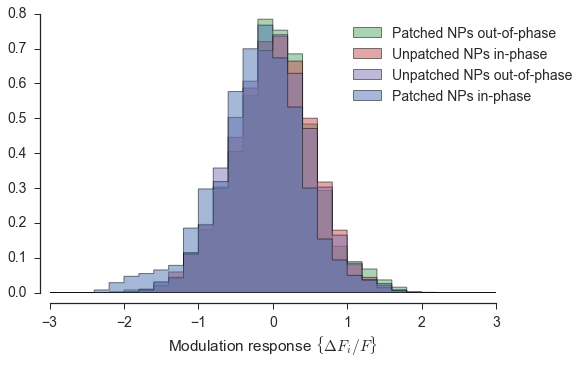

In [105]:
sns.set_context('notebook', font_scale=1.4)
sns.set_style('ticks')
hist_style = dict(
    bins = np.arange(-3, 3.1, 0.20),
    normed = True,
    histtype='stepfilled', lw=1, alpha=0.5)

fig, ax = plt.subplots(figsize=(8, 5))
ax.hist(np.concatenate(signal_toto), color=colors[1], label='Patched NPs out-of-phase', **hist_style)
ax.hist(np.concatenate(signal_totu), color=colors[2], label='Unpatched NPs in-phase', **hist_style)
ax.hist(np.concatenate(signal_totuo), color=colors[3], label='Unpatched NPs out-of-phase', **hist_style)
ax.hist(np.concatenate(signal_tot), color=colors[0], label='Patched NPs in-phase', **hist_style)

ax.legend(loc='upper right', ncol=1, bbox_to_anchor=(1.2, 1))
ax.set_xlabel('Modulation response $\{\Delta F_i/F\}$')
ax.set_xlim(-3, 3)
sns.despine(offset=10, trim=True);
plt.savefig('paper_figures/aggregated_signal_distribution.png', dpi=180, bbox_inches='tight');

> **NOTE**: The previous plot is a little hard to read. Nonetheless, you can note that Patched QDs distribution (*blue*) 
> is slightly shifted toward negative values compared to all the other distributions. 
> Moreover, there is an asymmetry in the tail of the Patched QDs distribution, 
> namely the negative tail is "higher" and "longer" (almost a "bump"), possibly due to modulated fluorescence.

# 10. Auto-correlation analysis

The ACF approach turns out to be less sensitive than using the alternated differences. This section is left here only as a reference and future developments.

In [106]:
def acf(series):
    dseries = series - series.mean()
    full_size = 2*series.size - 1
    tau = np.arange(0, (full_size+1)/2)
    acf_full = np.correlate(dseries, dseries, mode='full')/(dseries*dseries).sum()
    assert acf_full[(full_size-1)/2:].size == (full_size+1)/2
    return tau, acf_full[(full_size-1)/2:]

In [107]:
points_sel = points_patched
clip_radius = 1.8
detrend_sigma = None

acf_res = []
for ip, point in enumerate(points_sel):
    timetrace = tt.get_timetrace(data.video, point=point, clip_radius=clip_radius, detrend_sigma=detrend_sigma)
    #timetrace += 0.5*sim_signal
    #timetrace_on = timetrace
    time_on, timetrace_on = tt.get_on_periods_timetrace(timetrace, thresholds[ip], lowpass_sigma=10, align=4)

    acf_res.append(acf(timetrace_on))

scales = [16, 64, 512]
fig, ax = plt.subplots(len(points_sel), len(scales), 
                       figsize=(4*len(scales), 3*len(points_sel)))
fig.tight_layout()
for ip, point in enumerate(points_sel):
    for cidx, ncrop in enumerate(scales):
        ax[ip, cidx].plot(acf_res[ip][0][:ncrop], acf_res[ip][1][:ncrop], '-o', mew=0, ms=6, 
                          color=colors[ip], label='QD %d' % ip)
        #ax[ip, cidx].set_yscale('log')
    ax[ip, -1].legend()
    ax[ip, 1].set_title('ACF Patched QD %d' % ip)
plt.close(fig)
fig_patched = fig;

C:\Users\laser2002j\Miniconda3\envs\voltagesensing_env_py3\lib\site-packages\ipykernel\__main__.py:6: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
C:\Users\laser2002j\Miniconda3\envs\voltagesensing_env_py3\lib\site-packages\ipykernel\__main__.py:7: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


In [108]:
points_sel = points_unpatched

acf_res = []
for ip, point in enumerate(points_sel):
    timetrace = tt.get_timetrace(data.video, point=point, clip_radius=clip_radius, detrend_sigma=detrend_sigma)
    #timetrace_on = timetrace
    time_on, timetrace_on = tt.get_on_periods_timetrace(timetrace, thresholds[ip], lowpass_sigma=10, align=4)

    acf_res.append(acf(timetrace_on))

scales = [16, 64, 512]
fig, ax = plt.subplots(len(points_sel), len(scales), 
                       figsize=(4*len(scales), 3*len(points_sel)))
fig.tight_layout()
for ip, point in enumerate(points_sel):
    for cidx, ncrop in enumerate(scales):
        ax[ip, cidx].plot(acf_res[ip][0][:ncrop], acf_res[ip][1][:ncrop], '-o', mew=0, ms=6, 
                          color=colors[ip], label='QD %d' % ip)
        #ax[ip, cidx].set_yscale('log')
    ax[ip, -1].legend()
    ax[ip, 1].set_title('ACF Unpatched QD %d' % ip)
plt.close(fig)
fig_unpatched = fig;

C:\Users\laser2002j\Miniconda3\envs\voltagesensing_env_py3\lib\site-packages\ipykernel\__main__.py:6: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
C:\Users\laser2002j\Miniconda3\envs\voltagesensing_env_py3\lib\site-packages\ipykernel\__main__.py:7: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


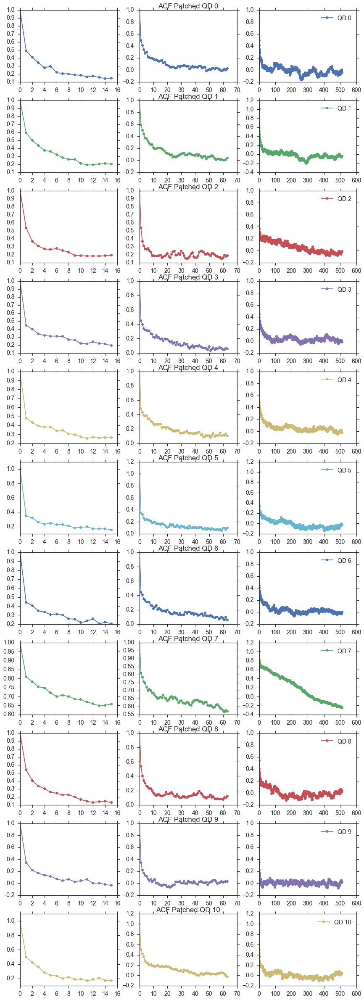

In [109]:
display(fig_patched)

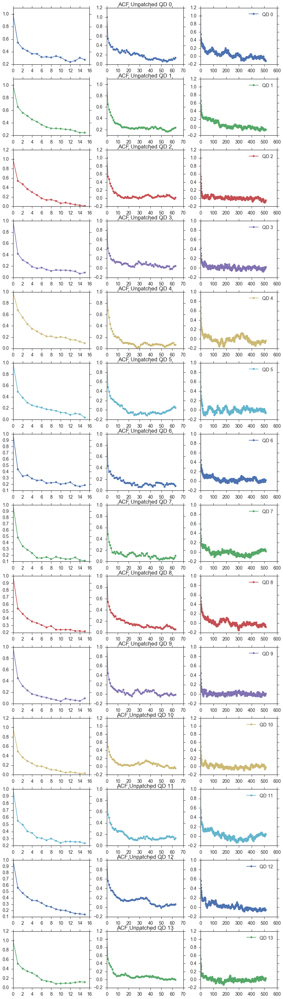

In [110]:
display(fig_unpatched)

# 11. Tests

Run consistency tests for the library functions:

In [111]:
tt.test_edge_diff(timetrace)